In [1]:
import imblearn
import pandas as pd
import numpy as np  
import matplotlib.pyplot as plt
import seaborn as sns
import time

from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_auc_score, f1_score, confusion_matrix, accuracy_score, classification_report, roc_curve, auc, precision_recall_curve, average_precision_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn import tree
from sklearn.decomposition import PCA

In [2]:
df = pd.read_csv("contributors2.csv")
df
selected_columns = ['name_with_owner','is_core', 'issues', 'prs', 'pr_comments_self', 'pr_comments_others', 
                    'issues_comments_self', 'issues_comments_others', 'pr_reactions_self', 'pr_reactions_others', 
                    'issues_reactions_self', 'issues_reactions_others', 'issue_hours_to_respond_reaction', 
                    'pr_hours_to_respond_reaction', 'issue_hours_to_respond_comment', 'pr_hours_to_respond_comment',
                    'days_to_close_issue', 'days_to_close_pr']

pred_cols = ['issues', 'prs', 'pr_comments_self', 'pr_comments_others', 
                    'issues_comments_self', 'issues_comments_others', 'pr_reactions_self', 'pr_reactions_others', 
                    'issues_reactions_self', 'issues_reactions_others', 'issue_hours_to_respond_reaction', 
                    'pr_hours_to_respond_reaction', 'issue_hours_to_respond_comment', 'pr_hours_to_respond_comment',
                    'days_to_close_issue', 'days_to_close_pr']

# Subset the DataFrame based on the selected columns
c1 = df[selected_columns].copy()
#get projects not in cluster
c2_cols = ['microsoft/azuredatastudio', 'xamarin/xamarin-macios', 'pingcap/docs']
c1_cols = ['umijs/umi', 'netbox-community/netbox', 'grafana/loki', 'awsdocs/aws-doc-sdk-examples', 'vueuse/vueuse',
     'yuzu-emu/yuzu', 'TanStack/query', 'lvgl/lvgl', 'arendst/Tasmota', 'Aircoookie/WLED']
#combine into one list
c1_cols = c2_cols + c1_cols
c1 = c1[~c1['name_with_owner'].isin(c1_cols)]
c1 = c1.drop(columns = 'name_with_owner')

In [3]:
X = c1.drop(columns = 'is_core')
y = c1['is_core']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=0)

In [4]:
train_df = pd.concat([X_train, y_train], axis=1)
test_df = pd.concat([X_test, y_test], axis=1)

In [5]:
train_df

,issues,prs,pr_comments_self,pr_comments_others,issues_comments_self,issues_comments_others,pr_reactions_self,pr_reactions_others,issues_reactions_self,issues_reactions_others,issue_hours_to_respond_reaction,pr_hours_to_respond_reaction,issue_hours_to_respond_comment,pr_hours_to_respond_comment,days_to_close_issue,days_to_close_pr,is_core
4365,0,1,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,9.976,0
3832,0,1,2,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,2.391,0
7347,0,29,157,11,0,5,2,0,0,0,0.000,0.000,2.314,75.865,0.000,15.062,0
7928,16,42,285,12,26,17,1,1,1,0,0.000,0.111,63.594,12.065,43.949,11.141,0
4780,2,2,13,0,12,2,2,0,0,0,0.000,0.000,0.213,0.000,40.771,31.338,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4897,0,0,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,0.000,0
7503,2,26,14,0,3,1,2,1,0,1,27.069,0.018,17.965,0.000,69.536,0.506,0
5522,5,2,7,0,12,0,0,4,3,1,0.017,24.216,0.000,0.000,57.035,20.555,0
6784,0,1,0,0,0,0,0,0,0,0,0.000,0.000,0.000,0.000,0.000,13.898,0


In [6]:
adasyn = imblearn.over_sampling.ADASYN(random_state = 0)
x_resampled_adasyn, y_resampled_adasyn = adasyn.fit_resample(X_train, y_train)
c1_train = pd.DataFrame(data=x_resampled_adasyn, columns=pred_cols)
c1_train['is_core'] = y_resampled_adasyn  # Assuming 'target' is the name of your target column
c1_train

,issues,prs,pr_comments_self,pr_comments_others,issues_comments_self,issues_comments_others,pr_reactions_self,pr_reactions_others,issues_reactions_self,issues_reactions_others,issue_hours_to_respond_reaction,pr_hours_to_respond_reaction,issue_hours_to_respond_comment,pr_hours_to_respond_comment,days_to_close_issue,days_to_close_pr,is_core
0,0,1,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,9.976000,0
1,0,1,2,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,2.391000,0
2,0,29,157,11,0,5,2,0,0,0,0.000000,0.000000,2.314000,75.865000,0.000000,15.062000,0
3,16,42,285,12,26,17,1,1,1,0,0.000000,0.111000,63.594000,12.065000,43.949000,11.141000,0
4,2,2,13,0,12,2,2,0,0,0,0.000000,0.000000,0.213000,0.000000,40.771000,31.338000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6388,49,615,187,19,3,45,6,0,0,0,0.000000,0.000000,32.298679,45.789309,3.893833,0.555305,1
6389,72,746,153,29,4,66,9,0,0,0,0.000000,0.000000,47.351884,67.129990,5.708603,0.727890,1
6390,45,491,241,30,28,38,9,1,0,1,0.741318,0.224372,129.600219,93.940548,42.339644,6.299744,1
6391,120,566,206,51,103,94,4,4,0,5,15.271256,16.112857,230.938863,114.070563,34.648798,2.963436,1


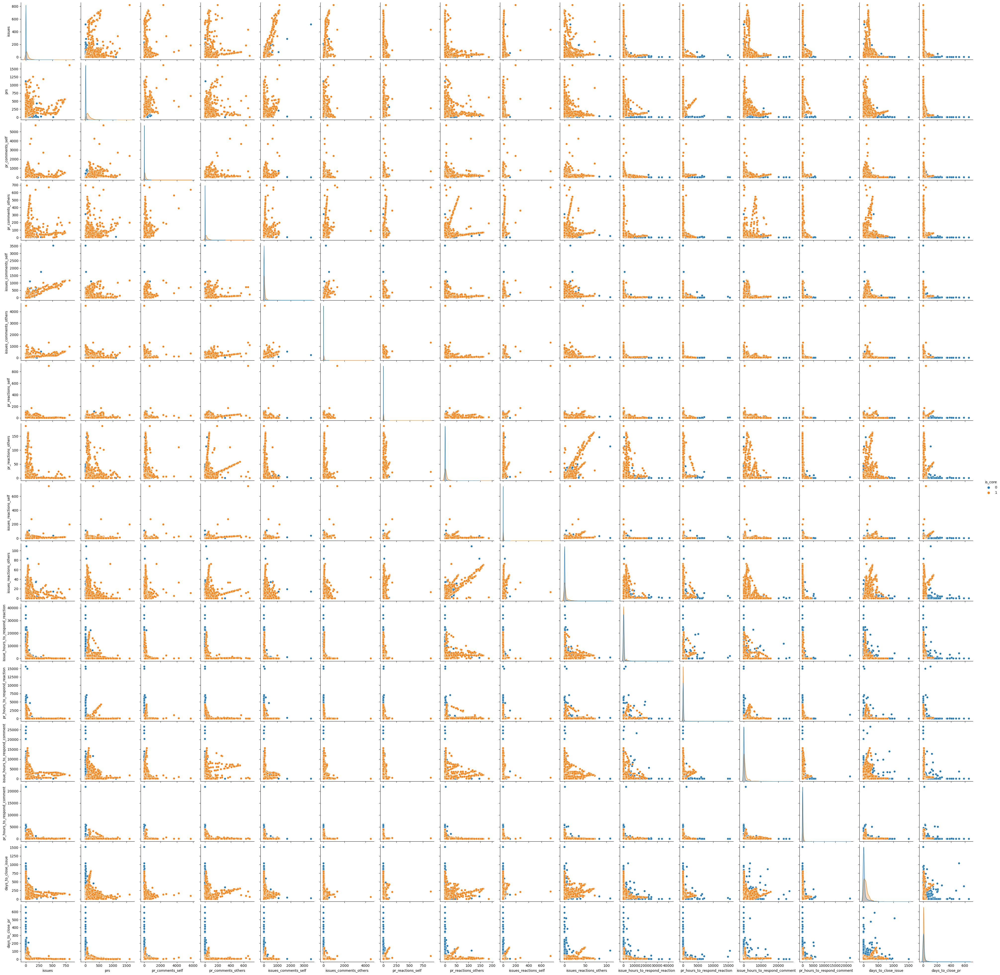

In [7]:
sns.pairplot(c1_train, hue = 'is_core')

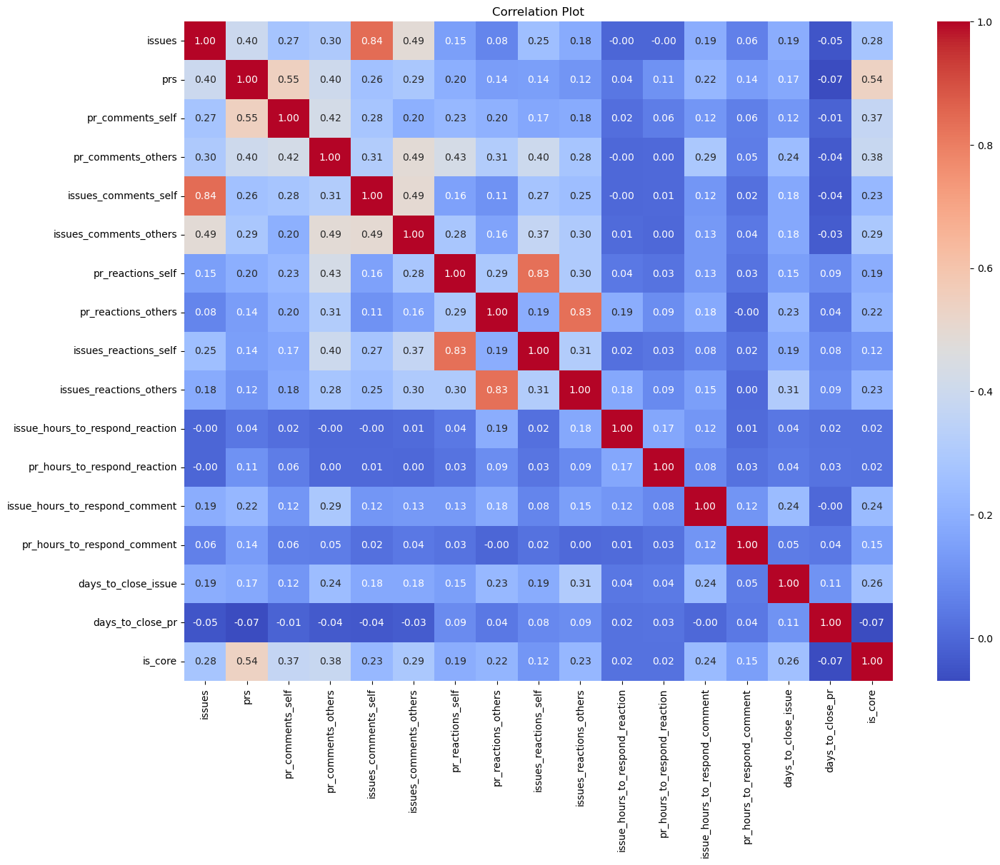

In [8]:
# Creating a correlation heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(c1_train.corr(), annot=True, cmap='coolwarm', fmt=".2f")

# Adding a title
plt.title('Correlation Plot')

# Displaying the plot
plt.show() 

In [9]:
X = c1_train.drop('is_core', axis=1)
y = c1_train['is_core']

# Calculating mutual information for each feature
mi_scores = mutual_info_classif(X, y)  # For classification tasks


# Displaying the mutual information scores
for feature, score in zip(X.columns, mi_scores):
    print(f"{feature}: {score:.4f}")

issues: 0.2244
prs: 0.5104
pr_comments_self: 0.3629
pr_comments_others: 0.4241
issues_comments_self: 0.1597
issues_comments_others: 0.3607
pr_reactions_self: 0.1256
pr_reactions_others: 0.1320
issues_reactions_self: 0.0718
issues_reactions_others: 0.0581
issue_hours_to_respond_reaction: 0.1276
pr_hours_to_respond_reaction: 0.2083
issue_hours_to_respond_comment: 0.3032
pr_hours_to_respond_comment: 0.3717
days_to_close_issue: 0.1728
days_to_close_pr: 0.1632


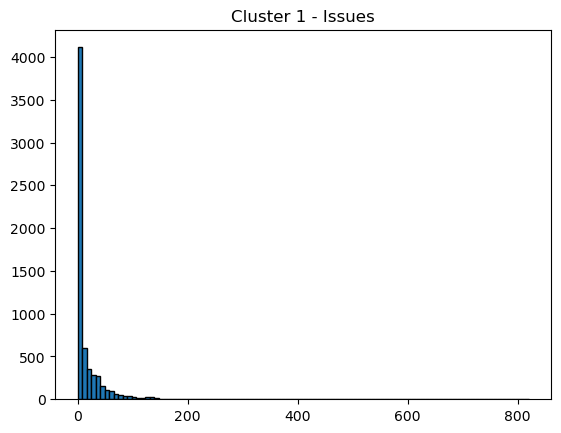

In [10]:
plt.hist(c1_train.issues, bins=100, edgecolor='black')
plt.title('Cluster 1 - Issues')
plt.show()

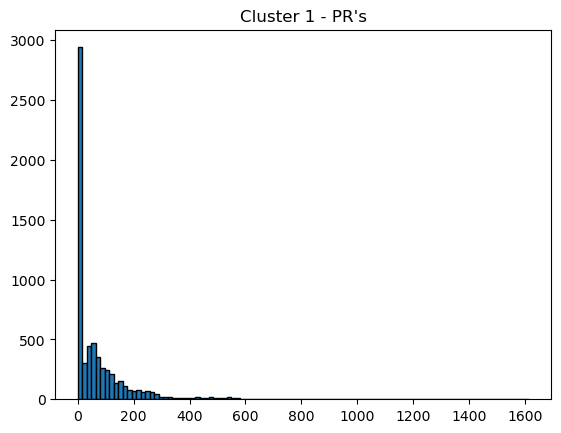

In [11]:
plt.hist(c1_train.prs, bins=100, edgecolor='black')
plt.title('Cluster 1 - PR\'s')
plt.show()

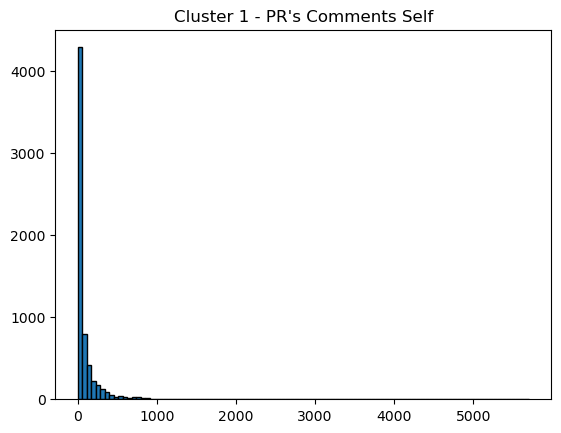

In [12]:
plt.hist(c1_train.pr_comments_self, bins=100, edgecolor='black')
plt.title('Cluster 1 - PR\'s Comments Self')
plt.show()

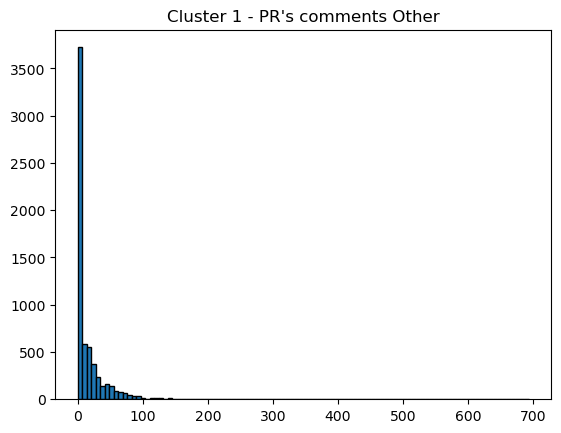

In [13]:
plt.hist(c1_train.pr_comments_others, bins=100, edgecolor='black')
plt.title('Cluster 1 - PR\'s comments Other')
plt.show()

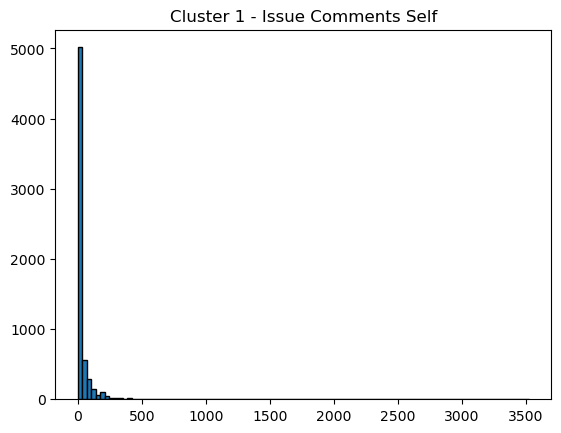

In [14]:
plt.hist(c1_train.issues_comments_self, bins=100, edgecolor='black')
plt.title('Cluster 1 - Issue Comments Self')
plt.show()

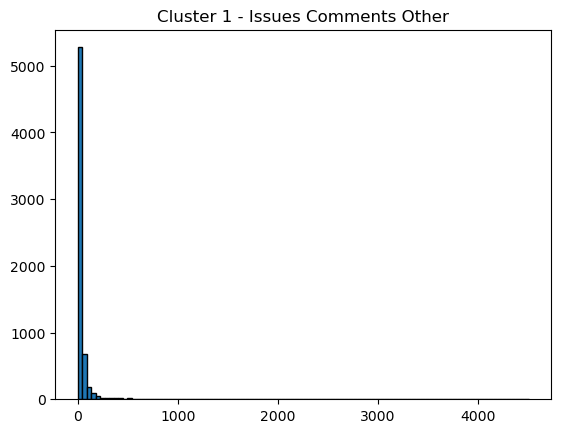

In [15]:
plt.hist(c1_train.issues_comments_others, bins=100, edgecolor='black')
plt.title('Cluster 1 - Issues Comments Other')
plt.show()

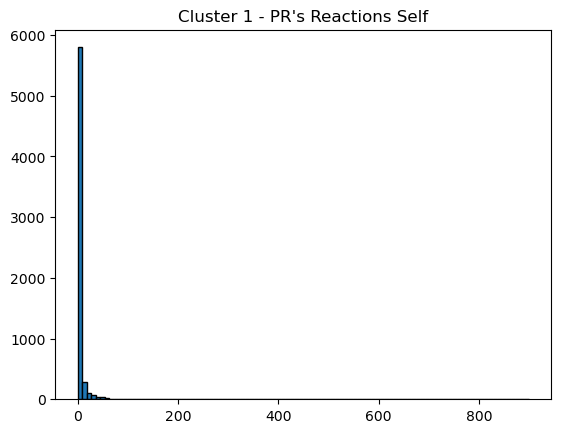

In [16]:
plt.hist(c1_train.pr_reactions_self, bins=100, edgecolor='black')
plt.title('Cluster 1 - PR\'s Reactions Self')
plt.show()

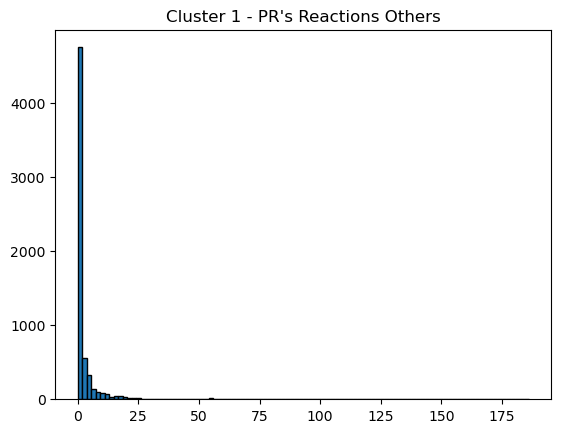

In [17]:
plt.hist(c1_train.pr_reactions_others, bins=100, edgecolor='black')
plt.title('Cluster 1 - PR\'s Reactions Others')
plt.show()

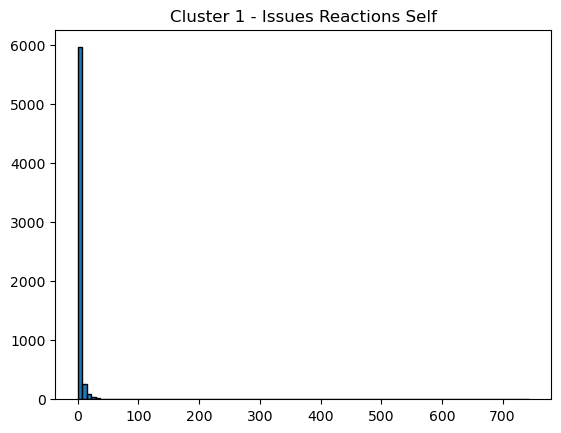

In [18]:
plt.hist(c1_train.issues_reactions_self, bins=100, edgecolor='black')
plt.title('Cluster 1 - Issues Reactions Self')
plt.show()

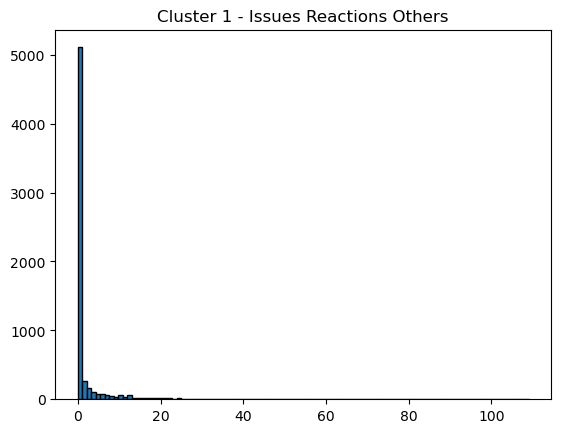

In [19]:
plt.hist(c1_train.issues_reactions_others, bins=100, edgecolor='black')
plt.title('Cluster 1 - Issues Reactions Others')
plt.show()

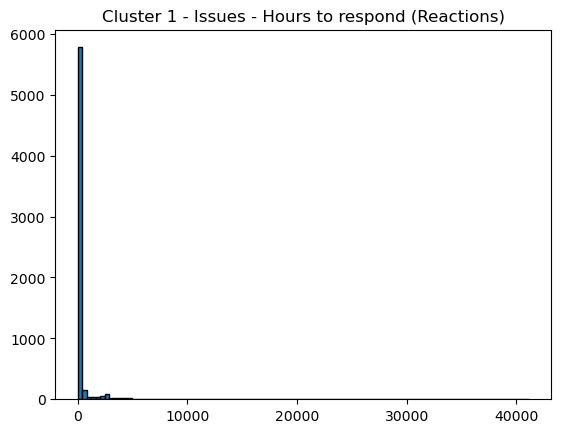

In [20]:
plt.hist(c1_train.issue_hours_to_respond_reaction, bins=100, edgecolor='black')
plt.title('Cluster 1 - Issues - Hours to respond (Reactions)')
plt.show()

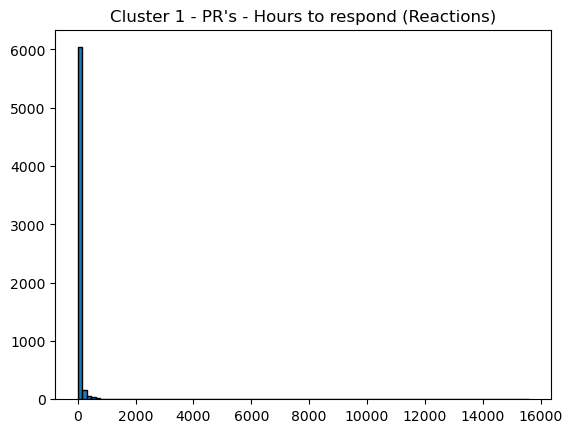

In [21]:
plt.hist(c1_train.pr_hours_to_respond_reaction, bins=100, edgecolor='black')
plt.title('Cluster 1 - PR\'s - Hours to respond (Reactions)')
plt.show()

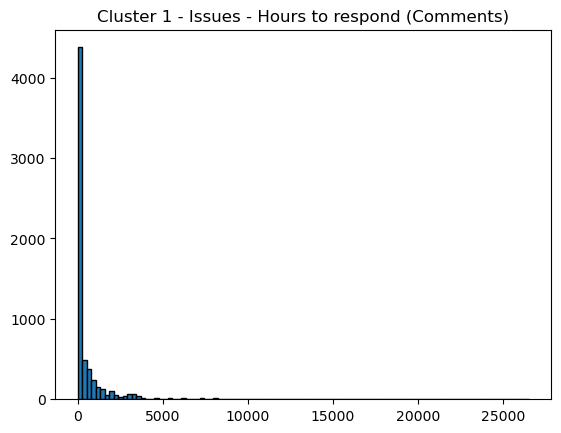

In [22]:
plt.hist(c1_train.issue_hours_to_respond_comment, bins=100, edgecolor='black')
plt.title('Cluster 1 - Issues - Hours to respond (Comments)')
plt.show()

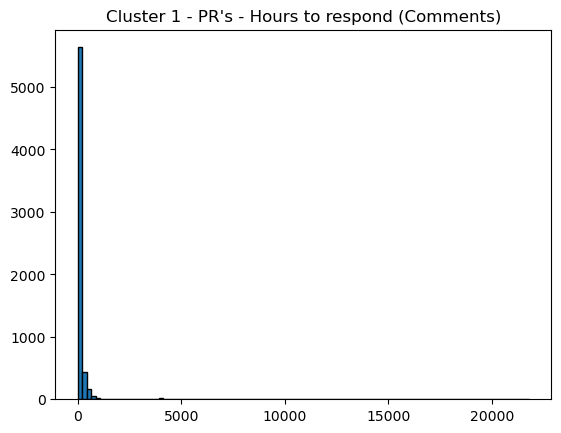

In [23]:
plt.hist(c1_train.pr_hours_to_respond_comment, bins=100, edgecolor='black')
plt.title('Cluster 1 - PR\'s - Hours to respond (Comments)')
plt.show()

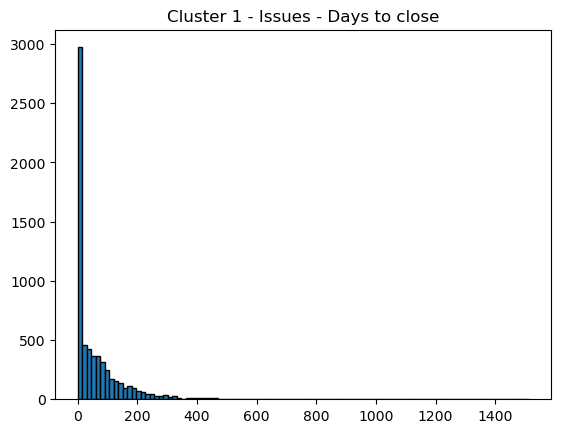

In [24]:
plt.hist(c1_train.days_to_close_issue, bins=100, edgecolor='black')
plt.title('Cluster 1 - Issues - Days to close')
plt.show()

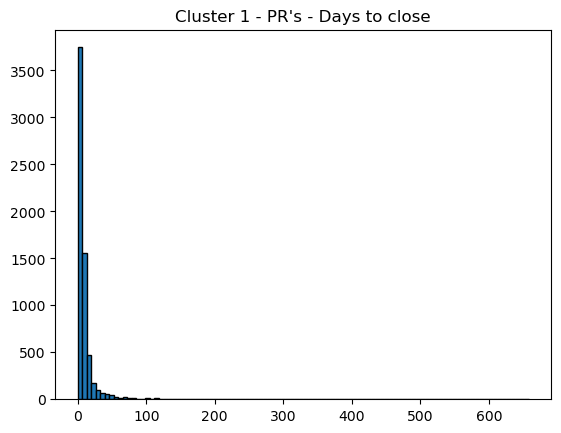

In [25]:
plt.hist(c1_train.days_to_close_pr, bins=100, edgecolor='black')
plt.title('Cluster 1 - PR\'s - Days to close')
plt.show()

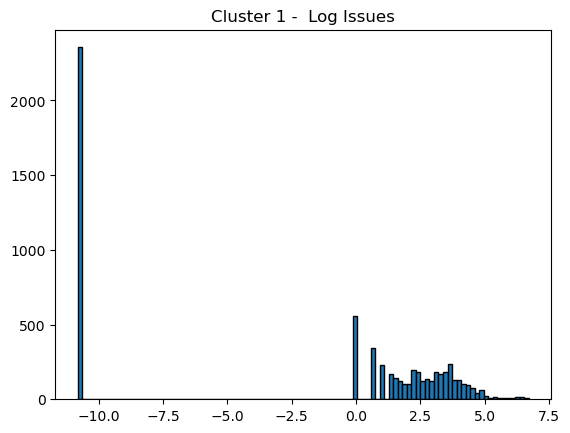

In [26]:
plt.hist(np.log(c1_train.issues + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 1 -  Log Issues')
plt.show()

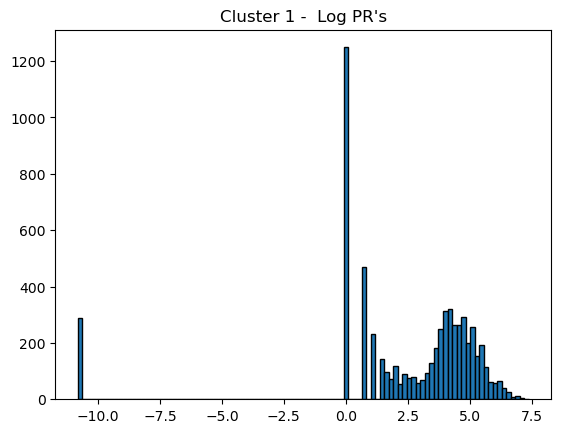

In [27]:
plt.hist(np.log(c1_train.prs + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 1 -  Log PR\'s')
plt.show()

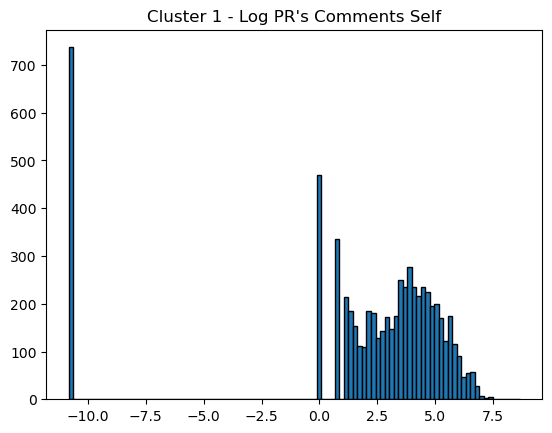

In [28]:
plt.hist(np.log(c1_train.pr_comments_self + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 1 - Log PR\'s Comments Self')
plt.show()

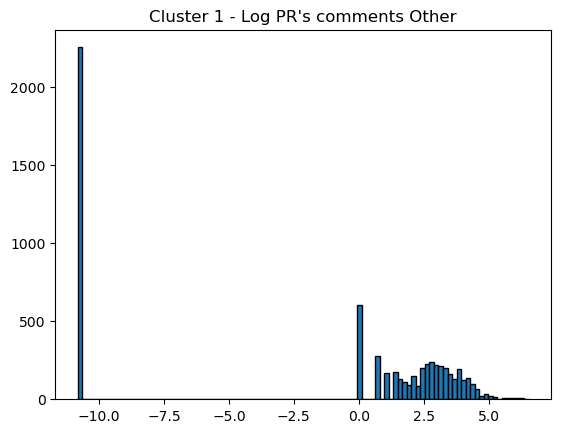

In [29]:
plt.hist(np.log(c1_train.pr_comments_others + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 1 - Log PR\'s comments Other')
plt.show()

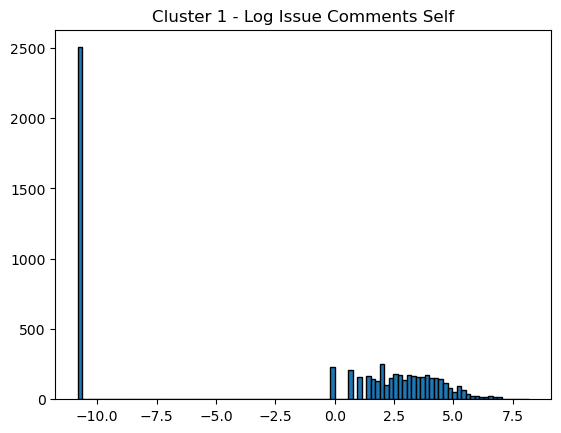

In [30]:
plt.hist(np.log(c1_train.issues_comments_self + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 1 - Log Issue Comments Self')
plt.show()

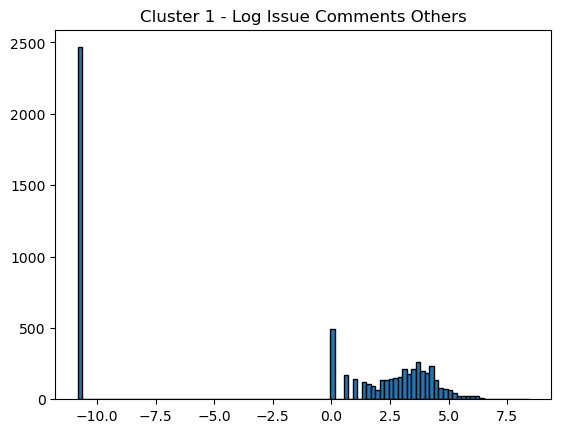

In [31]:
plt.hist(np.log(c1_train.issues_comments_others + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 1 - Log Issue Comments Others')
plt.show()

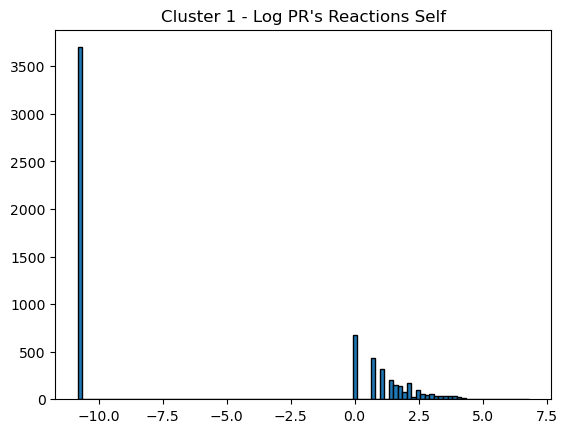

In [32]:
plt.hist(np.log(c1_train.pr_reactions_self + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 1 - Log PR\'s Reactions Self')
plt.show()

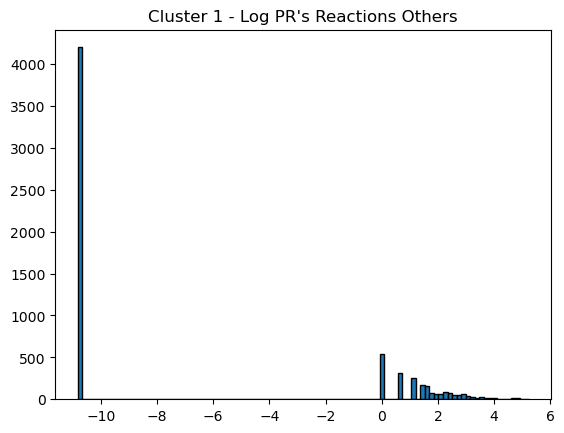

In [33]:
plt.hist(np.log(c1_train.pr_reactions_others + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 1 - Log PR\'s Reactions Others')
plt.show()

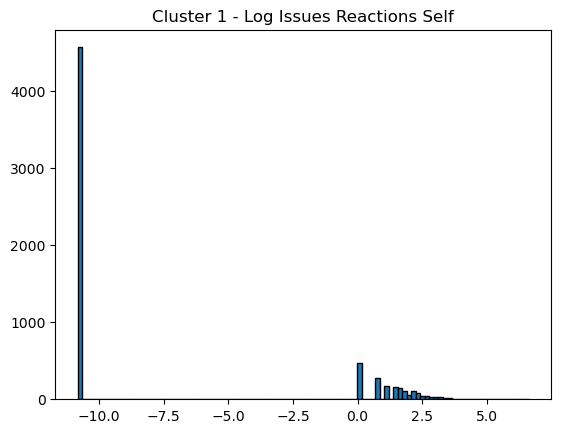

In [34]:
plt.hist(np.log(c1_train.issues_reactions_self + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 1 - Log Issues Reactions Self')
plt.show()

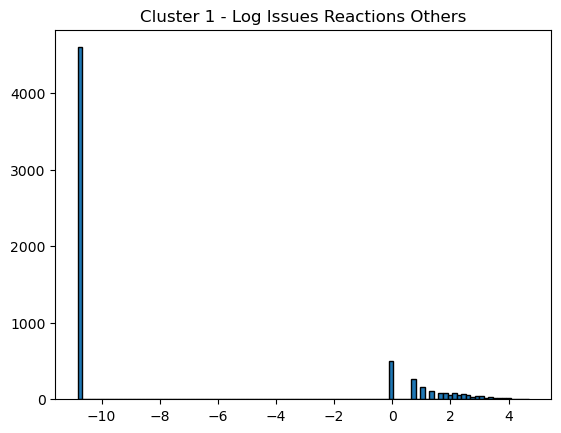

In [35]:
plt.hist(np.log(c1_train.issues_reactions_others + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 1 - Log Issues Reactions Others')
plt.show()

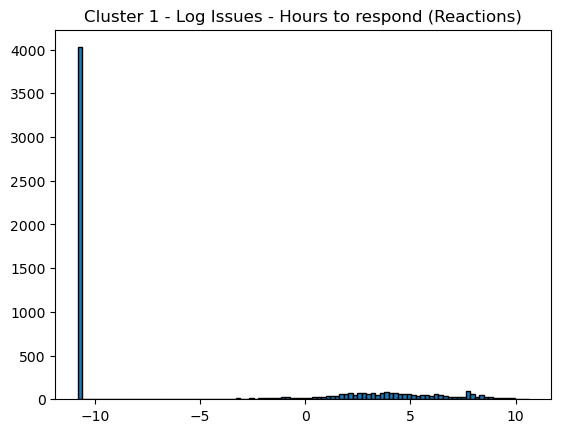

In [36]:
plt.hist(np.log(c1_train.issue_hours_to_respond_reaction + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 1 - Log Issues - Hours to respond (Reactions)')
plt.show()

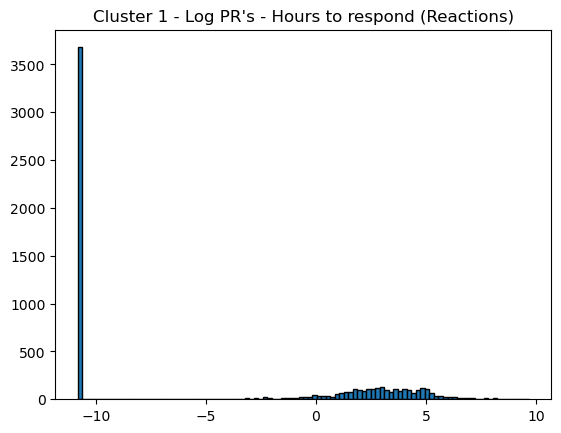

In [37]:
plt.hist(np.log(c1_train.pr_hours_to_respond_reaction + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 1 - Log PR\'s - Hours to respond (Reactions)')
plt.show()

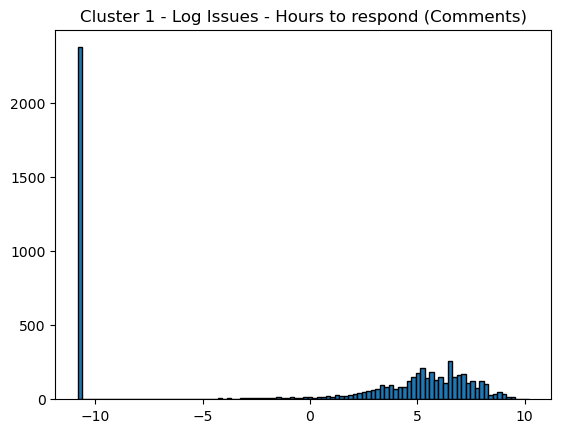

In [38]:
plt.hist(np.log(c1_train.issue_hours_to_respond_comment + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 1 - Log Issues - Hours to respond (Comments)')
plt.show()

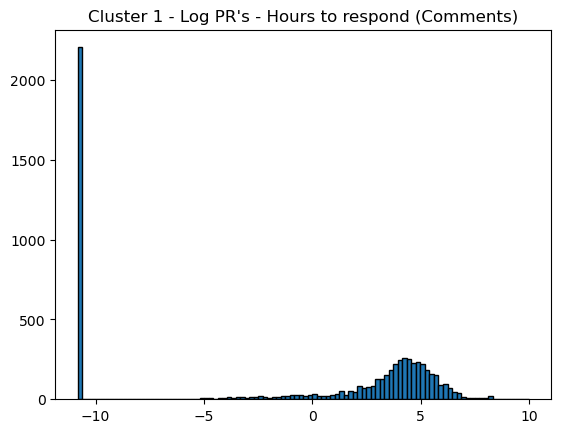

In [39]:
plt.hist(np.log(c1_train.pr_hours_to_respond_comment + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 1 - Log PR\'s - Hours to respond (Comments)')
plt.show()

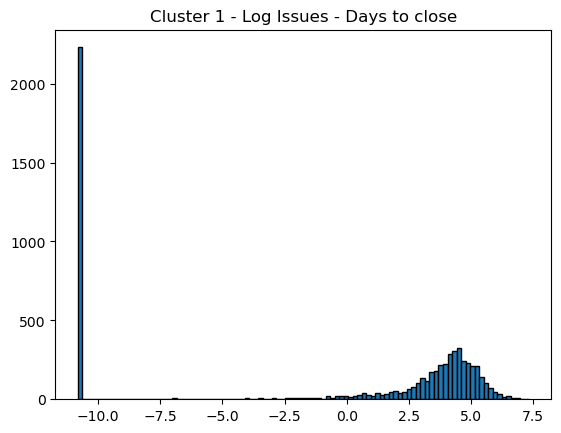

In [40]:
plt.hist(np.log(c1_train.days_to_close_issue + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 1 - Log Issues - Days to close')
plt.show()

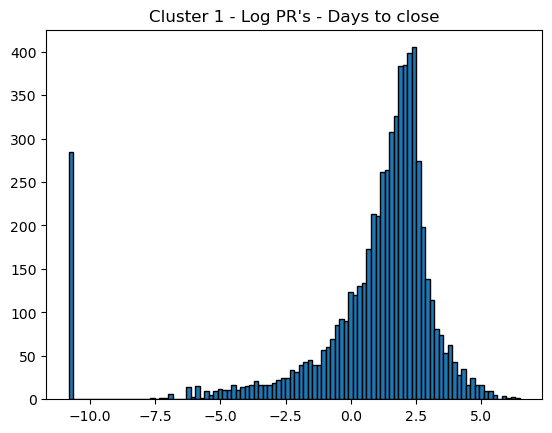

In [41]:
plt.hist(np.log(c1_train.days_to_close_pr + 2e-5), bins=100, edgecolor='black')
plt.title('Cluster 1 - Log PR\'s - Days to close')
plt.show()

In [42]:
c1_train.columns

Index(['issues', 'prs', 'pr_comments_self', 'pr_comments_others',
       'issues_comments_self', 'issues_comments_others', 'pr_reactions_self',
       'pr_reactions_others', 'issues_reactions_self',
       'issues_reactions_others', 'issue_hours_to_respond_reaction',
       'pr_hours_to_respond_reaction', 'issue_hours_to_respond_comment',
       'pr_hours_to_respond_comment', 'days_to_close_issue',
       'days_to_close_pr', 'is_core'],
      dtype='object')

In [43]:
c1_2 = c1_train.copy()
x = c1_2.drop(columns = 'is_core')
y = c1_2['is_core']


x['issues'] = np.log(x.issues+2e-5)
x['prs'] = np.log(x.prs+2e-5)
x['pr_comments_self'] = np.log(x.pr_comments_self+2e-5)
x['pr_comments_others'] = np.log(x.pr_comments_others+2e-5)
x['issues_comments_self'] = np.log(x.issues_comments_self+2e-5)
x['issues_comments_others'] = np.log(x.issues_comments_others+2e-5)
x['pr_reactions_self'] = np.log(x.pr_reactions_self+2e-5)
x['pr_reactions_others'] = np.log(x.pr_reactions_others+2e-5)
x['issues_reactions_self'] = np.log(x.issues_reactions_self+2e-5)
x['issues_reactions_others'] = np.log(x.issues_reactions_others+2e-5)
x['issue_hours_to_respond_reaction'] = np.log(x.issue_hours_to_respond_reaction+2e-5)
x['pr_hours_to_respond_reaction'] = np.log(x.pr_hours_to_respond_reaction+2e-5)
x['issue_hours_to_respond_comment'] = np.log(x.issue_hours_to_respond_comment + 1)
x['pr_hours_to_respond_comment'] = np.log(x.pr_hours_to_respond_comment+2e-5)
x['days_to_close_issue'] = np.log(x.days_to_close_issue+2e-5)
x['days_to_close_pr'] = np.log(x.days_to_close_pr+2e-5)

scaler = StandardScaler()
X_std = scaler.fit_transform(x)
train = pd.DataFrame(X_std, columns=x.columns)  # Set the columns explicitly

# Reset index of the original DataFrame
c1_2.reset_index(drop=True, inplace=True)

# Concatenate X_std DataFrame with 'is_core' column
train = pd.concat([train, y], axis=1)
train



,issues,prs,pr_comments_self,pr_comments_others,issues_comments_self,issues_comments_others,pr_reactions_self,pr_reactions_others,issues_reactions_self,issues_reactions_others,issue_hours_to_respond_reaction,pr_hours_to_respond_reaction,issue_hours_to_respond_comment,pr_hours_to_respond_comment,days_to_close_issue,days_to_close_pr,is_core
0,-1.285948,-0.653120,-2.589452,-1.331476,-1.225580,-1.239832,-0.846660,-0.717450,-0.630481,-0.619935,-0.738511,-0.838540,-1.087143,-1.327330,-1.338529,0.512175,0
1,-1.285948,-0.653120,-0.192146,-1.331476,-1.225580,-1.239832,-0.846660,-0.717450,-0.630481,-0.619935,-0.738511,-0.838540,-1.087143,-1.327330,-1.338529,0.050145,0
2,-1.285948,0.312495,0.716367,0.731080,-1.225580,0.603775,1.056351,-0.717450,-0.630481,-0.619935,-0.738511,-0.838540,-0.697993,0.795399,-1.338529,0.645432,0
3,0.816321,0.418705,0.840521,0.744658,0.838470,0.785295,0.941780,1.131745,1.338500,-0.619935,-0.738511,0.409374,0.266625,0.537757,0.723036,0.547899,0
4,0.494704,-0.454353,0.197612,-1.331476,0.725108,0.467864,1.056351,-0.717450,-0.630481,-0.619935,-0.738511,-0.838540,-1.024427,-1.327330,0.712440,0.882406,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6388,0.989427,1.188367,0.752778,0.816365,0.521855,0.929685,1.237943,-0.717450,-0.630481,-0.619935,-0.738511,-0.838540,0.051418,0.724649,0.380878,-0.422060,1
6389,1.048949,1.243742,0.710993,0.882350,0.564033,0.986494,1.304964,-0.717450,-0.630481,-0.619935,-0.738511,-0.838540,0.172561,0.778258,0.434889,-0.334528,1
6390,0.976256,1.123794,0.805603,0.887640,0.849335,0.904606,1.304964,1.131745,-0.630481,1.349211,0.699960,0.511225,0.495285,0.825345,0.717769,0.363496,1
6391,1.127956,1.164558,0.772928,0.970442,1.040307,1.038949,1.170923,1.368672,-0.630481,1.642117,1.113608,1.129844,0.681823,0.852551,0.689469,0.119568,1


In [44]:
x = X_test.copy()
x['issues'] = np.log(x.issues+2e-5)
x['prs'] = np.log(x.prs+2e-5)
x['pr_comments_self'] = np.log(x.pr_comments_self+2e-5)
x['pr_comments_others'] = np.log(x.pr_comments_others+2e-5)
x['issues_comments_self'] = np.log(x.issues_comments_self+2e-5)
x['issues_comments_others'] = np.log(x.issues_comments_others+2e-5)
x['pr_reactions_self'] = np.log(x.pr_reactions_self+2e-5)
x['pr_reactions_others'] = np.log(x.pr_reactions_others+2e-5)
x['issues_reactions_self'] = np.log(x.issues_reactions_self+2e-5)
x['issues_reactions_others'] = np.log(x.issues_reactions_others+2e-5)
x['issue_hours_to_respond_reaction'] = np.log(x.issue_hours_to_respond_reaction+2e-5)
x['pr_hours_to_respond_reaction'] = np.log(x.pr_hours_to_respond_reaction+2e-5)
x['issue_hours_to_respond_comment'] = np.log(x.issue_hours_to_respond_comment + 1)
x['pr_hours_to_respond_comment'] = np.log(x.pr_hours_to_respond_comment+2e-5)
x['days_to_close_issue'] = np.log(x.days_to_close_issue+2e-5)
x['days_to_close_pr'] = np.log(x.days_to_close_pr+2e-5)

x2 = x.copy()
x2 = scaler.transform(x2)
test = pd.DataFrame(x2, columns=x.columns)
test = test.reset_index(drop=True)
x = x.reset_index(drop=True)
y_test = y_test.reset_index(drop = True)
test = pd.concat([test, y_test], axis = 1)
test

,issues,prs,pr_comments_self,pr_comments_others,issues_comments_self,issues_comments_others,pr_reactions_self,pr_reactions_others,issues_reactions_self,issues_reactions_others,issue_hours_to_respond_reaction,pr_hours_to_respond_reaction,issue_hours_to_respond_comment,pr_hours_to_respond_comment,days_to_close_issue,days_to_close_pr,is_core
0,0.387500,-0.653120,0.036613,-1.331476,0.462407,0.365052,-0.846660,-0.717450,-0.630481,-0.619935,-0.738511,-0.838540,-1.084555,-1.327330,0.305998,0.035195,0
1,0.688462,-0.139312,0.036613,0.356903,0.736843,0.528005,-0.846660,1.131745,1.464637,1.349211,0.940322,0.439830,-0.648964,-0.333710,0.753853,0.190755,0
2,-1.285948,0.462910,0.451490,0.356903,-1.225580,-1.239832,-0.846660,-0.717450,-0.630481,-0.619935,-0.738511,-0.838540,-1.087143,0.923680,-1.338529,0.108642,0
3,0.806339,0.766002,0.667233,0.973472,0.882052,0.809401,1.170923,-0.717450,-0.630481,1.349211,1.239060,-0.838540,0.587999,0.738304,0.689995,0.155633,1
4,0.727332,-0.023040,0.096516,0.528334,0.873425,0.733631,-0.846660,1.131745,1.338500,-0.619935,-0.738511,0.029029,0.250810,1.019098,0.721830,0.362790,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
836,0.986238,0.312495,0.391587,1.008293,1.001412,0.959450,-0.846660,1.250208,-0.630481,-0.619935,-0.738511,0.649923,1.208045,1.059817,0.918439,1.331559,1
837,-1.285948,-0.653120,-0.192146,-1.331476,-1.225580,-1.239832,-0.846660,-0.717450,-0.630481,-0.619935,-0.738511,-0.838540,-1.087143,-1.327330,-1.338529,-0.593334,0
838,-1.285948,-0.454353,0.036613,-1.331476,-1.225580,-1.239832,-0.846660,-0.717450,-0.630481,-0.619935,-0.738511,-0.838540,-1.087143,-1.327330,-1.338529,-0.158338,0
839,-1.285948,0.082411,0.162827,-1.331476,-1.225580,-1.239832,-0.846660,-0.717450,-0.630481,-0.619935,-0.738511,-0.838540,-1.087143,-1.327330,-1.338529,0.612145,0


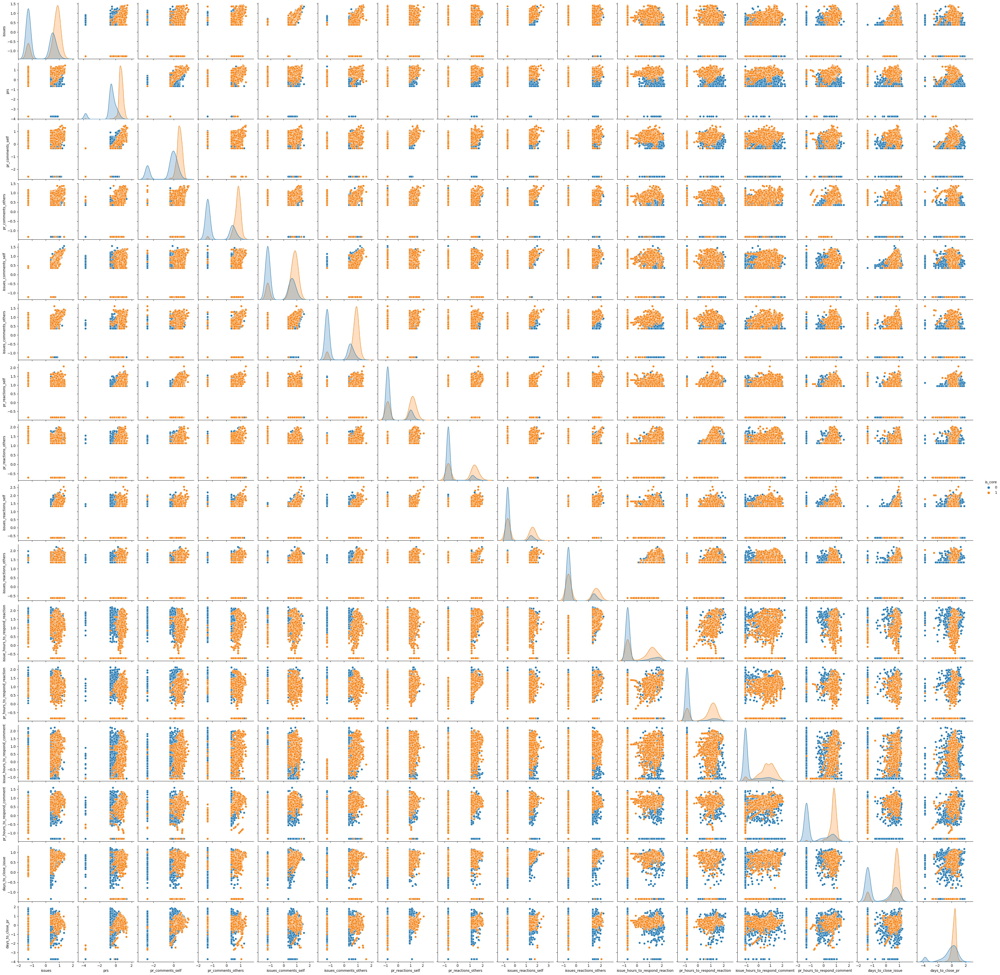

In [45]:
sns.pairplot(train, hue = 'is_core')

In [46]:
# Calculating mutual information for each feature
mi_scores2 = mutual_info_classif(X_std, y)  # For classification tasks


# Displaying the mutual information scores
for feature, score in zip(X.columns, mi_scores2):
    print(f"{feature}: {score:.4f}")

issues: 0.2267
prs: 0.5117
pr_comments_self: 0.3559
pr_comments_others: 0.4274
issues_comments_self: 0.1624
issues_comments_others: 0.3591
pr_reactions_self: 0.1264
pr_reactions_others: 0.1215
issues_reactions_self: 0.0555
issues_reactions_others: 0.0626
issue_hours_to_respond_reaction: 0.1156
pr_hours_to_respond_reaction: 0.2169
issue_hours_to_respond_comment: 0.3047
pr_hours_to_respond_comment: 0.3737
days_to_close_issue: 0.1725
days_to_close_pr: 0.1634


In [47]:
for feature, score in zip(X.columns, mi_scores):
    print(f"{feature}: {score:.4f}")

issues: 0.2244
prs: 0.5104
pr_comments_self: 0.3629
pr_comments_others: 0.4241
issues_comments_self: 0.1597
issues_comments_others: 0.3607
pr_reactions_self: 0.1256
pr_reactions_others: 0.1320
issues_reactions_self: 0.0718
issues_reactions_others: 0.0581
issue_hours_to_respond_reaction: 0.1276
pr_hours_to_respond_reaction: 0.2083
issue_hours_to_respond_comment: 0.3032
pr_hours_to_respond_comment: 0.3717
days_to_close_issue: 0.1728
days_to_close_pr: 0.1632


In [48]:
for i in range(len(mi_scores)):
    print(X.columns[i], ":", round(mi_scores2[i] - mi_scores[i], 4))

issues : 0.0023
prs : 0.0014
pr_comments_self : -0.007
pr_comments_others : 0.0034
issues_comments_self : 0.0026
issues_comments_others : -0.0016
pr_reactions_self : 0.0008
pr_reactions_others : -0.0105
issues_reactions_self : -0.0163
issues_reactions_others : 0.0046
issue_hours_to_respond_reaction : -0.012
pr_hours_to_respond_reaction : 0.0086
issue_hours_to_respond_comment : 0.0015
pr_hours_to_respond_comment : 0.002
days_to_close_issue : -0.0002
days_to_close_pr : 0.0002


In [49]:
sorted_data = [x for _, x in sorted(zip(mi_scores2, X.columns), reverse=True)]
sorted_values = sorted(mi_scores2, reverse=True)

Text(0.5, 1.0, 'Mutual Information of Features')

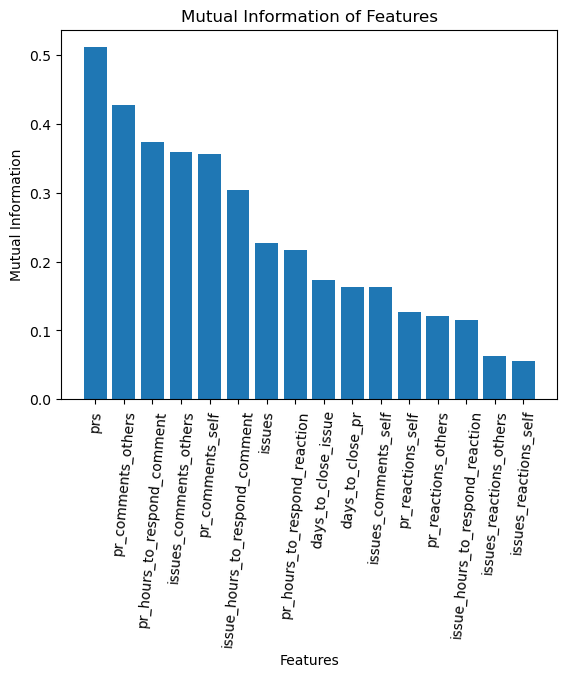

In [50]:
plt.bar(sorted_data, sorted_values)
plt.xticks(rotation=85) 
plt.xlabel('Features')
plt.ylabel('Mutual Information')
plt.title('Mutual Information of Features')

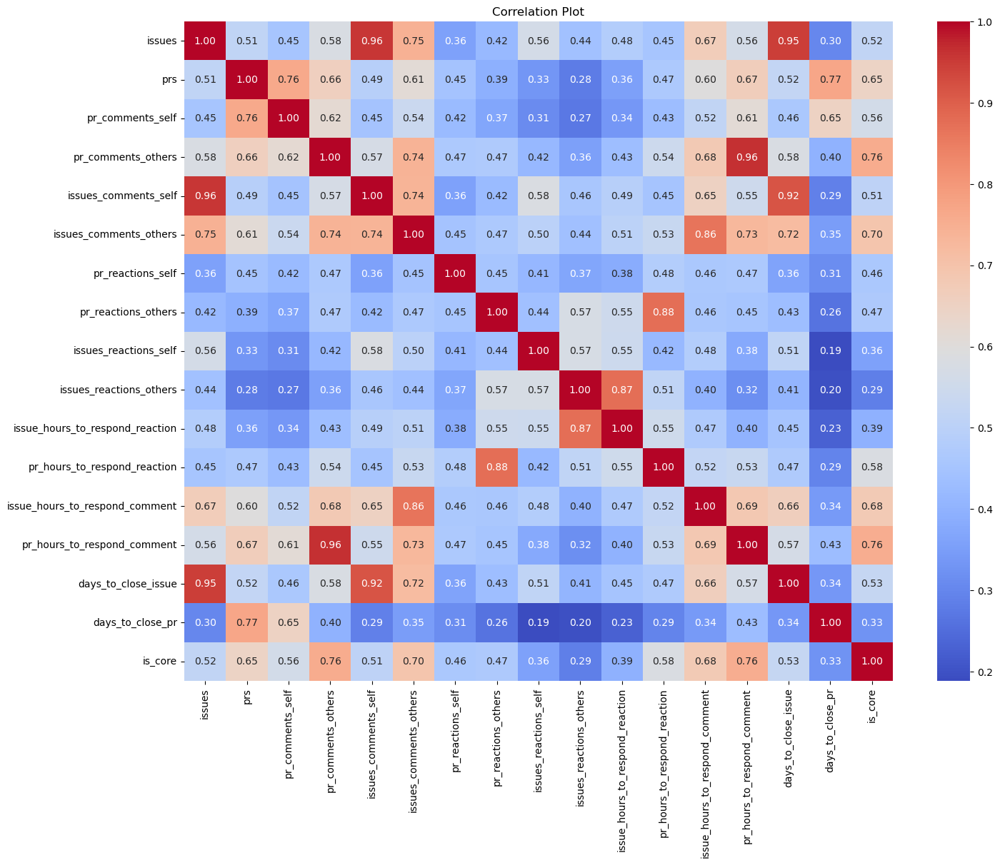

In [51]:
# Creating a correlation heatmap
plt.figure(figsize=(16, 12))
sns.heatmap(train.corr(), annot=True, cmap='coolwarm', fmt=".2f")

# Adding a title
plt.title('Correlation Plot')

# Displaying the plot
plt.show() 

In [52]:
test['is_core'] = pd.Categorical(test['is_core'])
test['is_core'] = pd.Categorical(test['is_core'])

X_train = train.drop(columns = "is_core")
X_test = test.drop(columns = 'is_core')

y_train = train['is_core']
y_test = test['is_core']

X_train_filter = X_train.copy()
X_test_filter = X_test.copy()

X_train_filter = X_train_filter.drop(columns = ['issues_comments_self', 'days_to_close_issue', 'pr_hours_to_respond_comment', 
                                                'issue_hours_to_respond_comment', 'pr_reactions_others', 'issues_reactions_others',
                                               'issue_hours_to_respond_reaction', 'issues_reactions_self', 'days_to_close_pr'])

X_test_filter = X_test_filter.drop(columns = ['issues_comments_self', 'days_to_close_issue', 'pr_hours_to_respond_comment', 
                                                'issue_hours_to_respond_comment', 'pr_reactions_others', 'issues_reactions_others',
                                               'issue_hours_to_respond_reaction', 'issues_reactions_self', 'days_to_close_pr'])

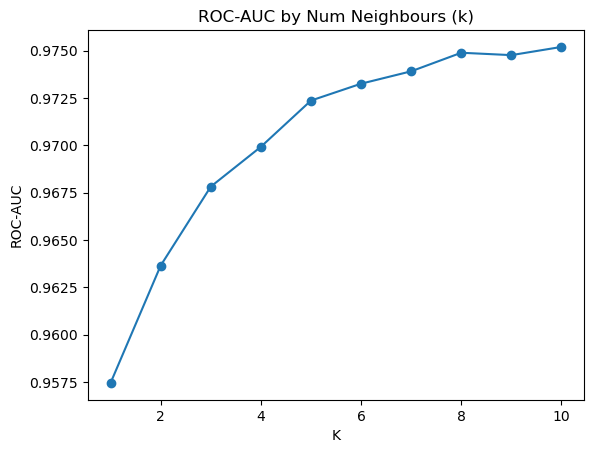

In [53]:
# Create a KNN classifier
k_vals = list(range(1, 11))
scores = []

for k in k_vals:
    knn_classifier = KNeighborsClassifier(n_neighbors=k)  # You can adjust the number of neighbors (n_neighbors) as needed

    # Perform 10-fold cross-validation
    kf = KFold(n_splits=10, shuffle=True, random_state=42)
    cv_scores = cross_val_score(knn_classifier, X_train, y_train, cv=kf, scoring = 'average_precision')
    
    scores.append(np.mean(cv_scores))
    
plt.plot(k_vals, scores, marker='o', linestyle='-')
plt.title('ROC-AUC by Num Neighbours (k)')
plt.xlabel('K')
plt.ylabel('ROC-AUC')
plt.show()

In [54]:
max_k = scores.index(max(scores))+1
knn_classifier_final = KNeighborsClassifier(n_neighbors=max_k)
knn_classifier_final.fit(X_train, y_train)


y_pred = knn_classifier_final.predict(X_test)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[734  54]
 [  7  46]]

Test Set Accuracy: 0.93

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.93      0.96       788
           1       0.46      0.87      0.60        53

    accuracy                           0.93       841
   macro avg       0.73      0.90      0.78       841
weighted avg       0.96      0.93      0.94       841



In [55]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_samples': [0.5, 0.6, 0.7]
}


# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV with 10-fold cross-validation
rf_grid_search = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs=-1)

t1 = time.time()
# Fit the grid search to the data
rf_grid_search.fit(X_train, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", rf_grid_search.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(rf_grid_search.best_score_))

# Evaluate the model on the test set with the best parameters
rf_best_model = rf_grid_search.best_estimator_
y_pred = rf_best_model.predict(X_test)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Search completed in 1.65 Minutes

Best Hyperparameters: {'max_depth': 15, 'max_samples': 0.6, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best Cross-Validation Accuracy: 0.99
Confusion Matrix:
[[757  31]
 [  6  47]]

Test Set Accuracy: 0.96

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.96      0.98       788
           1       0.60      0.89      0.72        53

    accuracy                           0.96       841
   macro avg       0.80      0.92      0.85       841
weighted avg       0.97      0.96      0.96       841



In [56]:
param_grid = {
    'max_depth': [3, 5, 10, 15],
    'min_samples_split': [3, 5, 10, 25],
    'min_samples_leaf': [2, 3, 5, 10]
}


# Initialize the DT Classifier
clf = tree.DecisionTreeClassifier(random_state=42, criterion = 'entropy')

# Initialize GridSearchCV with 10-fold cross-validation
dt_grid_search = GridSearchCV(estimator=clf, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)

t1 = time.time()
# Fit the grid search to the data
dt_grid_search.fit(X_train, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", dt_grid_search.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(dt_grid_search.best_score_))

# Evaluate the model on the test set with the best parameters
dt_best_model = dt_grid_search.best_estimator_
y_pred = dt_best_model.predict(X_test)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 64 candidates, totalling 640 fits
Search completed in 0.02 Minutes

Best Hyperparameters: {'max_depth': 5, 'min_samples_leaf': 3, 'min_samples_split': 25}
Best Cross-Validation Accuracy: 0.97
Confusion Matrix:
[[729  59]
 [  1  52]]

Test Set Accuracy: 0.93

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.93      0.96       788
           1       0.47      0.98      0.63        53

    accuracy                           0.93       841
   macro avg       0.73      0.95      0.80       841
weighted avg       0.97      0.93      0.94       841



In [57]:
y_pred = dt_best_model.predict(X_train)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_train, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_train, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_train, y_pred))

Confusion Matrix:
[[3012  170]
 [  37 3174]]

Test Set Accuracy: 0.97

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.95      0.97      3182
           1       0.95      0.99      0.97      3211

    accuracy                           0.97      6393
   macro avg       0.97      0.97      0.97      6393
weighted avg       0.97      0.97      0.97      6393



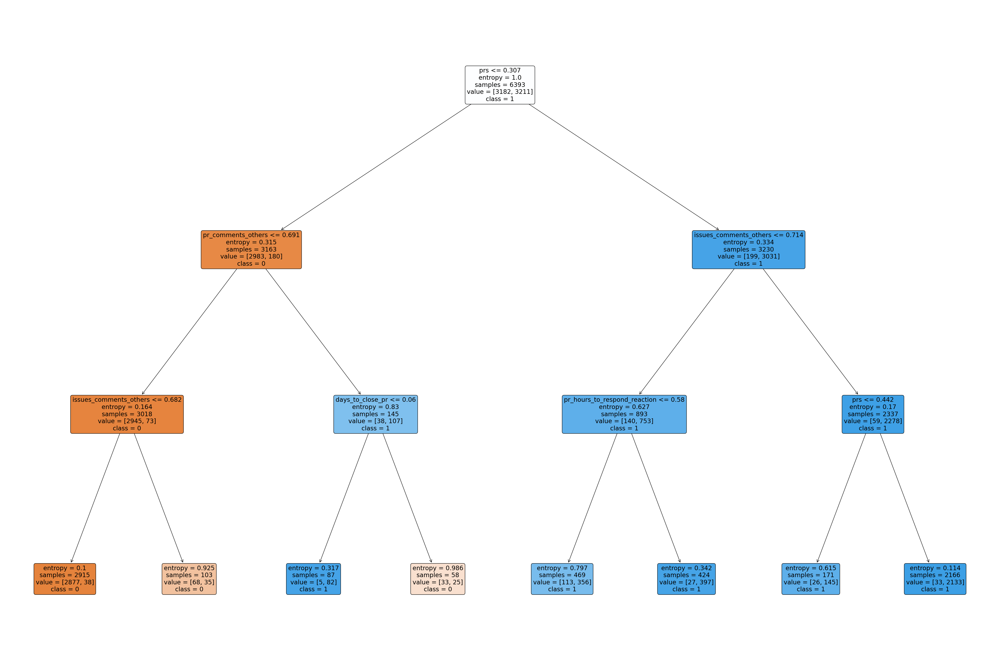

In [58]:
clf = tree.DecisionTreeClassifier(max_depth = 3, criterion='entropy')
clf = clf.fit(X_train, y_train)
plt.figure(figsize=(48, 32))
tree.plot_tree(clf, filled = True, rounded = True, feature_names = X_train.columns, class_names = y_train.unique().astype(str).tolist())
plt.show()

In [59]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.001, 0.01, 0.1],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}


# Initialize the Random Forest Classifier
xgboost = GradientBoostingClassifier(random_state=42)

# Initialize GridSearchCV with 10-fold cross-validation
xg_grid_search = GridSearchCV(estimator=xgboost, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)

t1 = time.time()
# Fit the grid search to the data
xg_grid_search.fit(X_train, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", xg_grid_search.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(xg_grid_search.best_score_))

# Evaluate the model on the test set with the best parameters
xg_best_model = xg_grid_search.best_estimator_
y_pred = xg_best_model.predict(X_test)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 243 candidates, totalling 2430 fits
Search completed in 6.66 Minutes

Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 150}
Best Cross-Validation Accuracy: 0.99
Confusion Matrix:
[[761  27]
 [  8  45]]

Test Set Accuracy: 0.96

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.97      0.98       788
           1       0.62      0.85      0.72        53

    accuracy                           0.96       841
   macro avg       0.81      0.91      0.85       841
weighted avg       0.97      0.96      0.96       841



In [60]:
# Define the logistic regression model
logistic_regression = LogisticRegression(solver = 'saga', random_state = 42)

# Define the hyperparameter grid to search through
param_grid = {
    'penalty': ['none', 'l1', 'l2', 'elasticnet'],  # Regularization type
    'C': [0.001, 0.01, 0.1, 1, 10],                  # Inverse of regularization strength              # Algorithm to use in the optimization problem
    'l1_ratio': [0.1, 0.5, 0.9],                    # Elastic Net mixing parameter (used when penalty='elasticnet')
}

# Initialize GridSearchCV
log_grid_search = GridSearchCV(estimator=logistic_regression, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)
t1 = time.time()
# Fit the grid search to the data
log_grid_search.fit(X_train, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

Fitting 10 folds for each of 60 candidates, totalling 600 fits
Search completed in 0.02 Minutes



In [61]:
# Print the best hyperparameters
print("Best Hyperparameters:", log_grid_search.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(log_grid_search.best_score_))

# Evaluate the model on the test set with the best parameters
log_best_model = log_grid_search.best_estimator_
y_pred = log_best_model.predict(X_test)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Best Hyperparameters: {'C': 1, 'l1_ratio': 0.5, 'penalty': 'elasticnet'}
Best Cross-Validation Accuracy: 0.98
Confusion Matrix:
[[734  54]
 [  3  50]]

Test Set Accuracy: 0.93

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.93      0.96       788
           1       0.48      0.94      0.64        53

    accuracy                           0.93       841
   macro avg       0.74      0.94      0.80       841
weighted avg       0.96      0.93      0.94       841



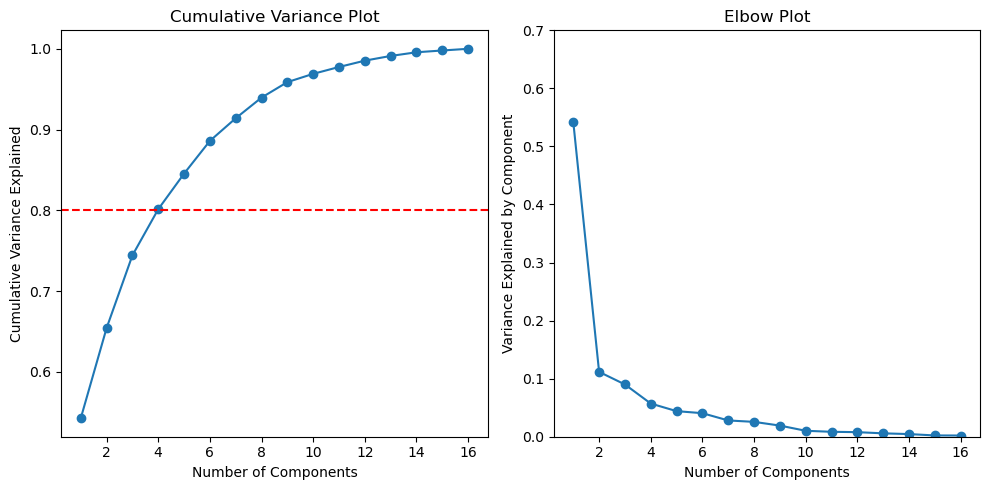

In [62]:
# Fit PCA and transform the standardized data
pca = PCA()
X_train_pca = pca.fit_transform(X_train)

# Elbow plot
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.title('Cumulative Variance Plot')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Explained')
plt.axhline(y=0.8, color='red', linestyle='--')

# Cumulative variance plot
plt.subplot(1, 2, 2)
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, marker='o')
plt.title('Elbow Plot')
plt.xlabel('Number of Components')
plt.ylabel('Variance Explained by Component')
plt.ylim(0, 0.7)  
plt.tight_layout()

plt.show()

In [63]:
pca = PCA(n_components=4)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

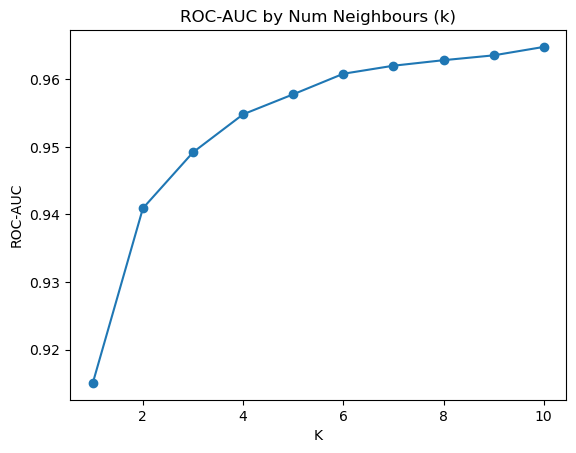

In [64]:
# Create a KNN classifier
k_vals = list(range(1, 11))
scores = []

for k in k_vals:
    knn_classifier = KNeighborsClassifier(n_neighbors=k)  # You can adjust the number of neighbors (n_neighbors) as needed

    # Perform 10-fold cross-validation
    kf = KFold(n_splits=10, shuffle=True, random_state=42)
    cv_scores = cross_val_score(knn_classifier, X_train_pca, y_train, cv=kf, scoring = 'average_precision')
    
    scores.append(np.mean(cv_scores))

plt.plot(k_vals, scores, marker='o', linestyle='-')
plt.title('ROC-AUC by Num Neighbours (k)')
plt.xlabel('K')
plt.ylabel('ROC-AUC')
plt.show()    

In [65]:
max_k = scores.index(max(scores))+1
knn_classifier_pca = KNeighborsClassifier(n_neighbors=max_k)
knn_classifier_pca.fit(X_train_pca, y_train)


y_pred = knn_classifier_pca.predict(X_test_pca)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[728  60]
 [ 10  43]]

Test Set Accuracy: 0.92

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.92      0.95       788
           1       0.42      0.81      0.55        53

    accuracy                           0.92       841
   macro avg       0.70      0.87      0.75       841
weighted avg       0.95      0.92      0.93       841



In [66]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_samples': [0.5, 0.6, 0.7]
}


# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV with 10-fold cross-validation
rf_grid_search_pca = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs=-1)

t1 = time.time()
# Fit the grid search to the data
rf_grid_search_pca.fit(X_train_pca, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", rf_grid_search_pca.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(rf_grid_search_pca.best_score_))

# Evaluate the model on the test set with the best parameters
rf_best_model_pca = rf_grid_search_pca.best_estimator_
y_pred = rf_best_model_pca.predict(X_test_pca)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Search completed in 1.98 Minutes

Best Hyperparameters: {'max_depth': 15, 'max_samples': 0.7, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Best Cross-Validation Accuracy: 0.97
Confusion Matrix:
[[732  56]
 [  8  45]]

Test Set Accuracy: 0.92

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.93      0.96       788
           1       0.45      0.85      0.58        53

    accuracy                           0.92       841
   macro avg       0.72      0.89      0.77       841
weighted avg       0.95      0.92      0.93       841



In [67]:
param_grid = {
    'max_depth': [3, 5, 10, 15],
    'min_samples_split': [3, 5, 10, 25],
    'min_samples_leaf': [2, 3, 5, 10]
}


# Initialize the DT Classifier
clf = tree.DecisionTreeClassifier(random_state=42, criterion = 'entropy')

# Initialize GridSearchCV with 10-fold cross-validation
dt_grid_search_pca = GridSearchCV(estimator=clf, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)

t1 = time.time()
# Fit the grid search to the data
dt_grid_search_pca.fit(X_train_pca, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", dt_grid_search_pca.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(dt_grid_search_pca.best_score_))

# Evaluate the model on the test set with the best parameters
dt_best_model_pca = dt_grid_search_pca.best_estimator_
y_pred = dt_best_model_pca.predict(X_test_pca)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 64 candidates, totalling 640 fits
Search completed in 0.02 Minutes

Best Hyperparameters: {'max_depth': 10, 'min_samples_leaf': 10, 'min_samples_split': 3}
Best Cross-Validation Accuracy: 0.95
Confusion Matrix:
[[738  50]
 [ 14  39]]

Test Set Accuracy: 0.92

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.94      0.96       788
           1       0.44      0.74      0.55        53

    accuracy                           0.92       841
   macro avg       0.71      0.84      0.75       841
weighted avg       0.95      0.92      0.93       841



In [68]:
y_pred = dt_best_model_pca.predict(X_train_pca)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_train, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_train, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_train, y_pred))

Confusion Matrix:
[[3019  163]
 [ 163 3048]]

Test Set Accuracy: 0.95

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95      3182
           1       0.95      0.95      0.95      3211

    accuracy                           0.95      6393
   macro avg       0.95      0.95      0.95      6393
weighted avg       0.95      0.95      0.95      6393



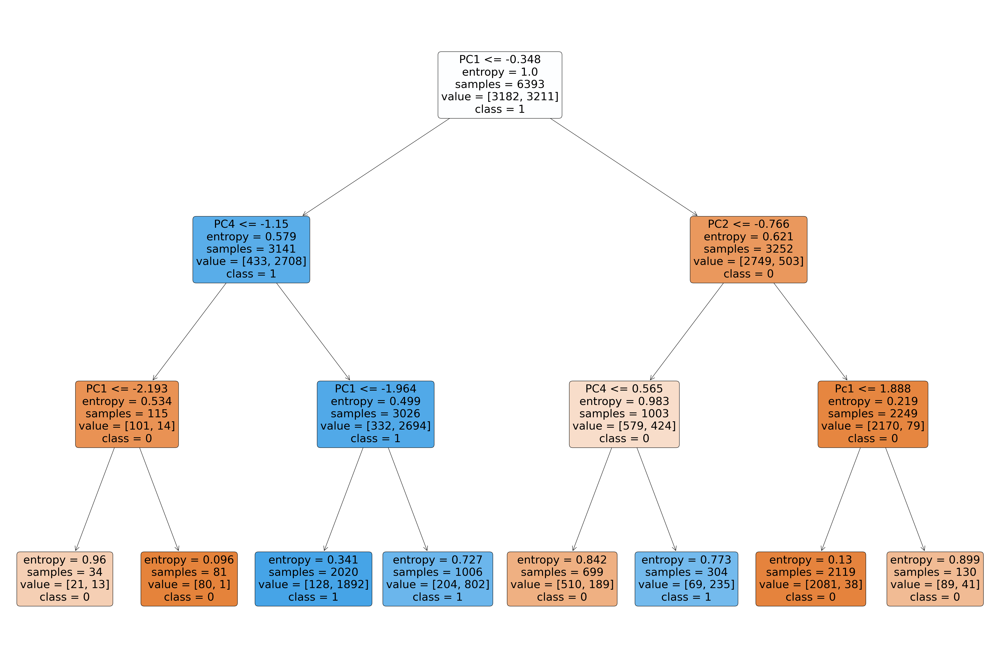

In [69]:
cols = ['PC1', 'PC2', 'Pc1', 'PC4']
clf = tree.DecisionTreeClassifier(max_depth = 3, criterion='entropy')
clf = clf.fit(X_train_pca, y_train)
plt.figure(figsize=(48, 32))
tree.plot_tree(clf, filled = True, rounded = True, feature_names = cols, class_names = y_train.unique().astype(str).tolist())
plt.show()

In [70]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.001, 0.01, 0.1],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}


# Initialize the Random Forest Classifier
xgboost = GradientBoostingClassifier(random_state=42)

# Initialize GridSearchCV with 10-fold cross-validation
xg_grid_search_pca = GridSearchCV(estimator=xgboost, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)

t1 = time.time()
# Fit the grid search to the data
xg_grid_search_pca.fit(X_train_pca, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", xg_grid_search_pca.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(xg_grid_search_pca.best_score_))

# Evaluate the model on the test set with the best parameters
xg_best_model_pca = xg_grid_search_pca.best_estimator_
y_pred = xg_best_model_pca.predict(X_test_pca)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 243 candidates, totalling 2430 fits
Search completed in 4.61 Minutes

Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 100}
Best Cross-Validation Accuracy: 0.97
Confusion Matrix:
[[727  61]
 [ 10  43]]

Test Set Accuracy: 0.92

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.92      0.95       788
           1       0.41      0.81      0.55        53

    accuracy                           0.92       841
   macro avg       0.70      0.87      0.75       841
weighted avg       0.95      0.92      0.93       841



In [71]:
# Define the logistic regression model
logistic_regression = LogisticRegression(solver = 'saga', random_state = 42)

# Define the hyperparameter grid to search through
param_grid = {
    'penalty': ['none', 'l1', 'l2', 'elasticnet'],  # Regularization type
    'C': [0.001, 0.01, 0.1, 1, 10],                  # Inverse of regularization strength              # Algorithm to use in the optimization problem
    'l1_ratio': [0.1, 0.5, 0.9],                    # Elastic Net mixing parameter (used when penalty='elasticnet')
}

# Initialize GridSearchCV
log_grid_search_pca = GridSearchCV(estimator=logistic_regression, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)
t1 = time.time()
# Fit the grid search to the data
log_grid_search_pca.fit(X_train_pca, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

Fitting 10 folds for each of 60 candidates, totalling 600 fits
Search completed in 0.01 Minutes



C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


In [72]:
# Print the best hyperparameters
print("Best Hyperparameters:", log_grid_search_pca.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(log_grid_search_pca.best_score_))

# Evaluate the model on the test set with the best parameters
log_best_model_pca = log_grid_search_pca.best_estimator_
y_pred = log_best_model_pca.predict(X_test_pca)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Best Hyperparameters: {'C': 0.01, 'l1_ratio': 0.1, 'penalty': 'l1'}
Best Cross-Validation Accuracy: 0.95
Confusion Matrix:
[[702  86]
 [  4  49]]

Test Set Accuracy: 0.89

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.89      0.94       788
           1       0.36      0.92      0.52        53

    accuracy                           0.89       841
   macro avg       0.68      0.91      0.73       841
weighted avg       0.95      0.89      0.91       841



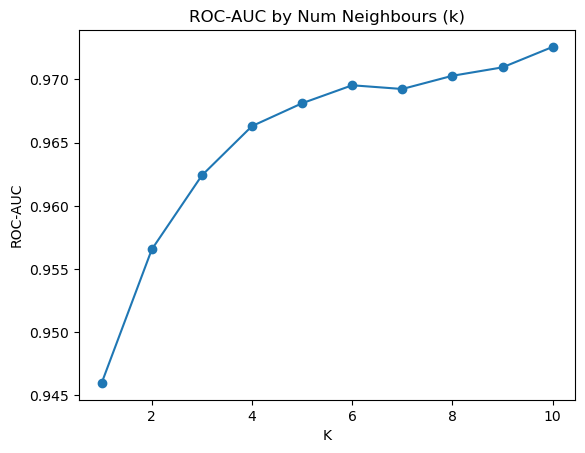

In [73]:
# Create a KNN classifier
k_vals = list(range(1, 11))
scores = []

for k in k_vals:
    knn_classifier = KNeighborsClassifier(n_neighbors=k)  # You can adjust the number of neighbors (n_neighbors) as needed

    # Perform 10-fold cross-validation
    kf = KFold(n_splits=10, shuffle=True, random_state=42)
    cv_scores = cross_val_score(knn_classifier, X_train_filter, y_train, cv=kf, scoring = 'average_precision')
    
    scores.append(np.mean(cv_scores))
    
plt.plot(k_vals, scores, marker='o', linestyle='-')
plt.title('ROC-AUC by Num Neighbours (k)')
plt.xlabel('K')
plt.ylabel('ROC-AUC')
plt.show()

In [74]:
max_k = scores.index(max(scores))+1
knn_classifier_filter = KNeighborsClassifier(n_neighbors=max_k)
knn_classifier_filter.fit(X_train_filter, y_train)


y_pred = knn_classifier_filter.predict(X_test_filter)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Confusion Matrix:
[[736  52]
 [  4  49]]

Test Set Accuracy: 0.93

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.93      0.96       788
           1       0.49      0.92      0.64        53

    accuracy                           0.93       841
   macro avg       0.74      0.93      0.80       841
weighted avg       0.96      0.93      0.94       841



In [75]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_samples': [0.5, 0.6, 0.7]
}


# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV with 10-fold cross-validation
rf_grid_search_filter = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs=-1)

t1 = time.time()
# Fit the grid search to the data
rf_grid_search_filter.fit(X_train_filter, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", rf_grid_search_filter.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(rf_grid_search_filter.best_score_))

# Evaluate the model on the test set with the best parameters
rf_best_model_filter = rf_grid_search_filter.best_estimator_
y_pred = rf_best_model_filter.predict(X_test_filter)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 324 candidates, totalling 3240 fits
Search completed in 1.08 Minutes

Best Hyperparameters: {'max_depth': 15, 'max_samples': 0.7, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 150}
Best Cross-Validation Accuracy: 0.99
Confusion Matrix:
[[748  40]
 [  5  48]]

Test Set Accuracy: 0.95

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.95      0.97       788
           1       0.55      0.91      0.68        53

    accuracy                           0.95       841
   macro avg       0.77      0.93      0.83       841
weighted avg       0.97      0.95      0.95       841



In [76]:
param_grid = {
    'max_depth': [3, 5, 10, 15],
    'min_samples_split': [3, 5, 10, 25],
    'min_samples_leaf': [2, 3, 5, 10]
}


# Initialize the DT Classifier
clf = tree.DecisionTreeClassifier(random_state=42, criterion = 'entropy')

# Initialize GridSearchCV with 10-fold cross-validation
dt_grid_search_filter = GridSearchCV(estimator=clf, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)

t1 = time.time()
# Fit the grid search to the data
dt_grid_search_filter.fit(X_train_filter, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", dt_grid_search_filter.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(dt_grid_search_filter.best_score_))

# Evaluate the model on the test set with the best parameters
dt_best_model_filter = dt_grid_search_filter.best_estimator_
y_pred = dt_best_model_filter.predict(X_test_filter)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 64 candidates, totalling 640 fits
Search completed in 0.01 Minutes

Best Hyperparameters: {'max_depth': 5, 'min_samples_leaf': 10, 'min_samples_split': 3}
Best Cross-Validation Accuracy: 0.97
Confusion Matrix:
[[726  62]
 [  3  50]]

Test Set Accuracy: 0.92

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.92      0.96       788
           1       0.45      0.94      0.61        53

    accuracy                           0.92       841
   macro avg       0.72      0.93      0.78       841
weighted avg       0.96      0.92      0.94       841



In [77]:
y_pred = dt_best_model_filter.predict(X_train_filter)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_train, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_train, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_train, y_pred))

Confusion Matrix:
[[2984  198]
 [  54 3157]]

Test Set Accuracy: 0.96

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.94      0.96      3182
           1       0.94      0.98      0.96      3211

    accuracy                           0.96      6393
   macro avg       0.96      0.96      0.96      6393
weighted avg       0.96      0.96      0.96      6393



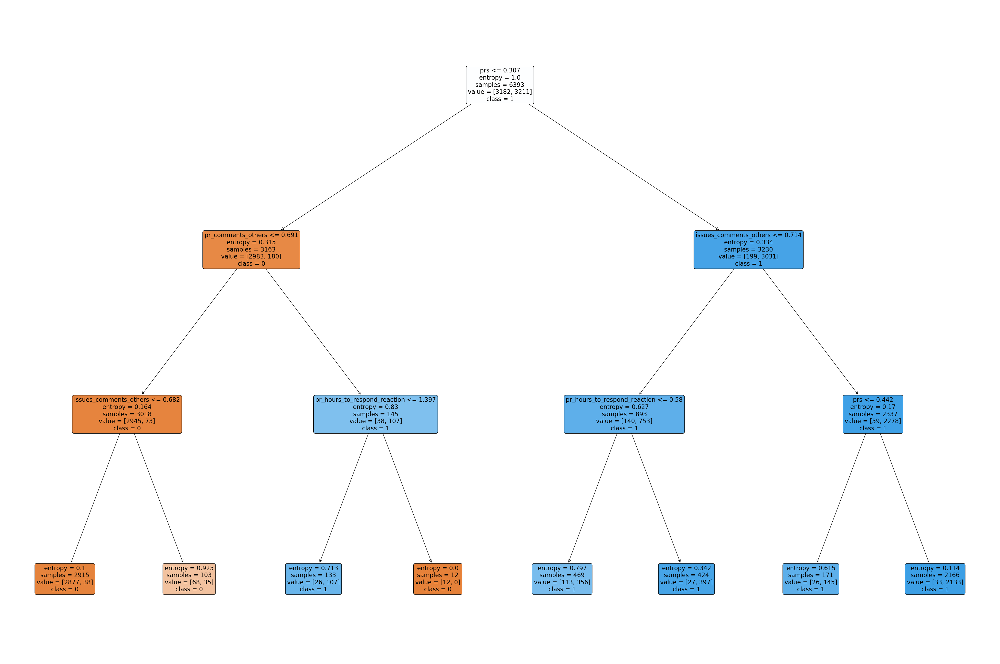

In [78]:
clf = tree.DecisionTreeClassifier(max_depth = 3, criterion='entropy')
clf = clf.fit(X_train_filter, y_train)
plt.figure(figsize=(48, 32))
tree.plot_tree(clf, filled = True, rounded = True, feature_names = X_train_filter.columns, class_names = y_train.unique().astype(str).tolist())
plt.show()

In [92]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.001, 0.01, 0.1],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}


# Initialize the Random Forest Classifier
xgboost = GradientBoostingClassifier(random_state=42)

# Initialize GridSearchCV with 10-fold cross-validation
xg_grid_search_filter = GridSearchCV(estimator=xgboost, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)

t1 = time.time()
# Fit the grid search to the data
xg_grid_search_filter.fit(X_train_filter, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

# Print the best hyperparameters
print("Best Hyperparameters:", xg_grid_search_filter.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(xg_grid_search_filter.best_score_))

# Evaluate the model on the test set with the best parameters
xg_best_model_filter = xg_grid_search_filter.best_estimator_
y_pred = xg_best_model_filter.predict(X_test_filter)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Fitting 10 folds for each of 243 candidates, totalling 2430 fits
Search completed in 2.73 Minutes

Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 150}
Best Cross-Validation Accuracy: 0.99
Confusion Matrix:
[[756  32]
 [  6  47]]

Test Set Accuracy: 0.95

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.96      0.98       788
           1       0.59      0.89      0.71        53

    accuracy                           0.95       841
   macro avg       0.79      0.92      0.84       841
weighted avg       0.97      0.95      0.96       841



In [93]:
# Define the logistic regression model
logistic_regression = LogisticRegression(solver = 'saga', random_state = 42)

# Define the hyperparameter grid to search through
param_grid = {
    'penalty': ['none', 'l1', 'l2', 'elasticnet'],  # Regularization type
    'C': [0.001, 0.01, 0.1, 1, 10],                  # Inverse of regularization strength              # Algorithm to use in the optimization problem
    'l1_ratio': [0.1, 0.5, 0.9],                    # Elastic Net mixing parameter (used when penalty='elasticnet')
}

# Initialize GridSearchCV
log_grid_search_filter = GridSearchCV(estimator=logistic_regression, param_grid=param_grid, cv=10, scoring='average_precision', verbose = 1, n_jobs = -1)
t1 = time.time()
# Fit the grid search to the data
log_grid_search_filter.fit(X_train_filter, y_train)

print("Search completed in", str(round((time.time() - t1) / 60, 2)), "Minutes\n")

Fitting 10 folds for each of 60 candidates, totalling 600 fits
Search completed in 0.01 Minutes



In [94]:
# Print the best hyperparameters
print("Best Hyperparameters:", log_grid_search_filter.best_params_)

# Print the best cross-validation score
print("Best Cross-Validation Accuracy: {:.2f}".format(log_grid_search_filter.best_score_))

# Evaluate the model on the test set with the best parameters
log_best_model_filter = log_grid_search_filter.best_estimator_
y_pred = log_best_model_filter.predict(X_test_filter)

# Print the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Calculate and print accuracy, precision, recall, and F1 score
accuracy = accuracy_score(y_test, y_pred)
print(f"\nTest Set Accuracy: {accuracy:.2f}")

# Print a classification report
print('\nClassification Report:')
print(classification_report(y_test, y_pred))

Best Hyperparameters: {'C': 0.1, 'l1_ratio': 0.9, 'penalty': 'elasticnet'}
Best Cross-Validation Accuracy: 0.98
Confusion Matrix:
[[725  63]
 [  2  51]]

Test Set Accuracy: 0.92

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.92      0.96       788
           1       0.45      0.96      0.61        53

    accuracy                           0.92       841
   macro avg       0.72      0.94      0.78       841
weighted avg       0.96      0.92      0.94       841



In [95]:
std_models = [knn_classifier_final, rf_best_model, dt_best_model, xg_best_model, log_best_model]
pca_models = [knn_classifier_pca, rf_best_model_pca, dt_best_model_pca, xg_best_model_pca, log_best_model_pca]
filter_models = [knn_classifier_filter, rf_best_model_filter, dt_best_model_filter, xg_best_model_filter, log_best_model_filter]

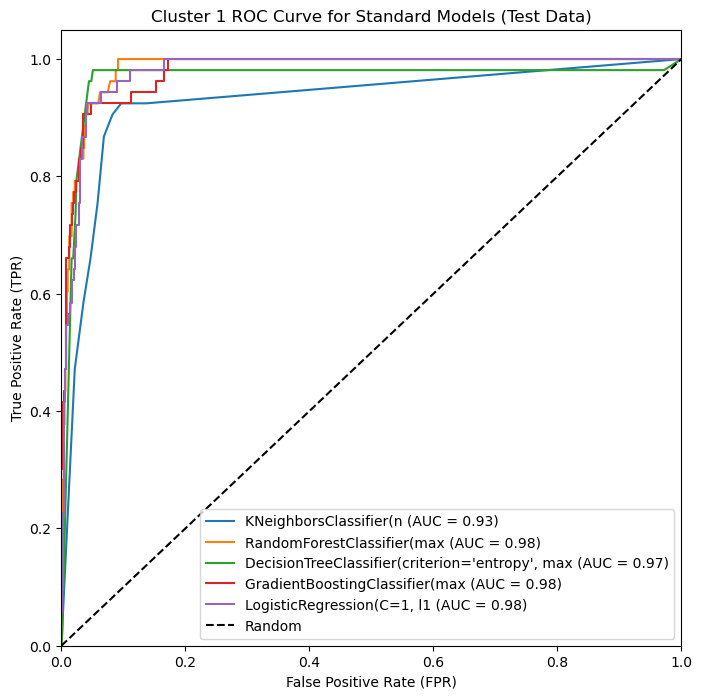

In [96]:
# Plot ROC curves for each model
plt.figure(figsize=(8, 8))

for model in std_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train, y_train)
    
    y_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    plt.plot(fpr, tpr, label=f'{short_model_name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random chance
plt.plot([0, 1], [0, 1], 'k--', label='Random')

# Customize the plot
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Cluster 1 ROC Curve for Standard Models (Test Data)')
plt.legend(loc='lower right')

plt.show()

C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


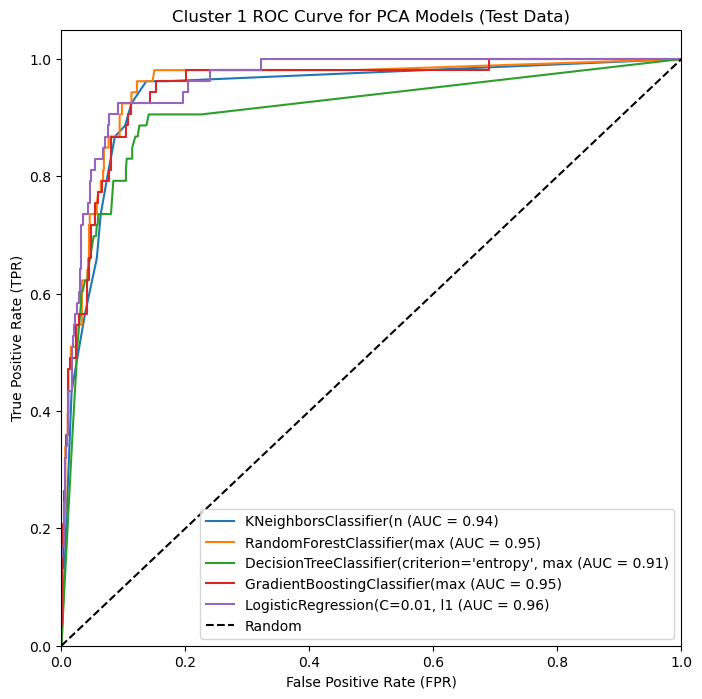

In [97]:
# Plot ROC curves for each model
plt.figure(figsize=(8, 8))

for model in pca_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_pca, y_train)
    
    y_prob = model.predict_proba(X_test_pca)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    plt.plot(fpr, tpr, label=f'{short_model_name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random chance
plt.plot([0, 1], [0, 1], 'k--', label='Random')

# Customize the plot
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Cluster 1 ROC Curve for PCA Models (Test Data)')
plt.legend(loc='lower right')

plt.show()

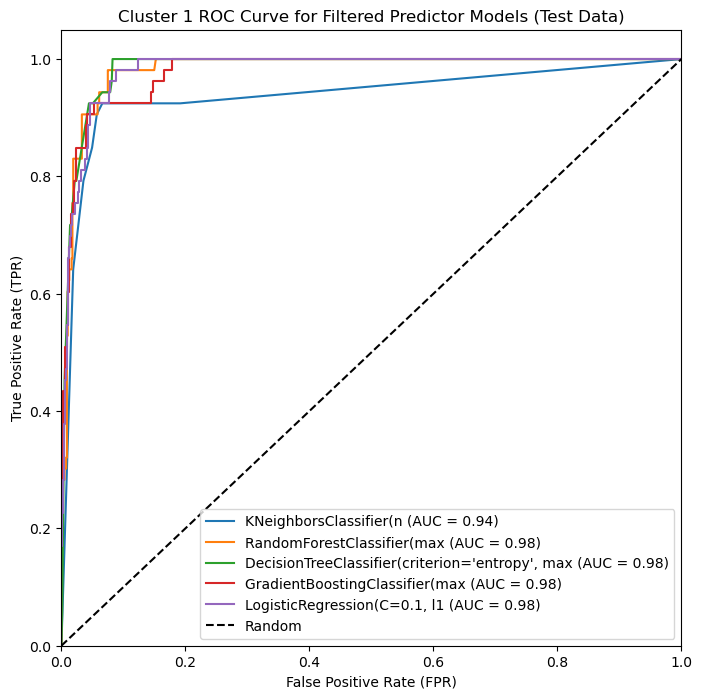

In [98]:
# Plot ROC curves for each model
plt.figure(figsize=(8, 8))

for model in filter_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_filter, y_train)
    
    y_prob = model.predict_proba(X_test_filter)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    plt.plot(fpr, tpr, label=f'{short_model_name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random chance
plt.plot([0, 1], [0, 1], 'k--', label='Random')

# Customize the plot
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Cluster 1 ROC Curve for Filtered Predictor Models (Test Data)')
plt.legend(loc='lower right')

plt.show()

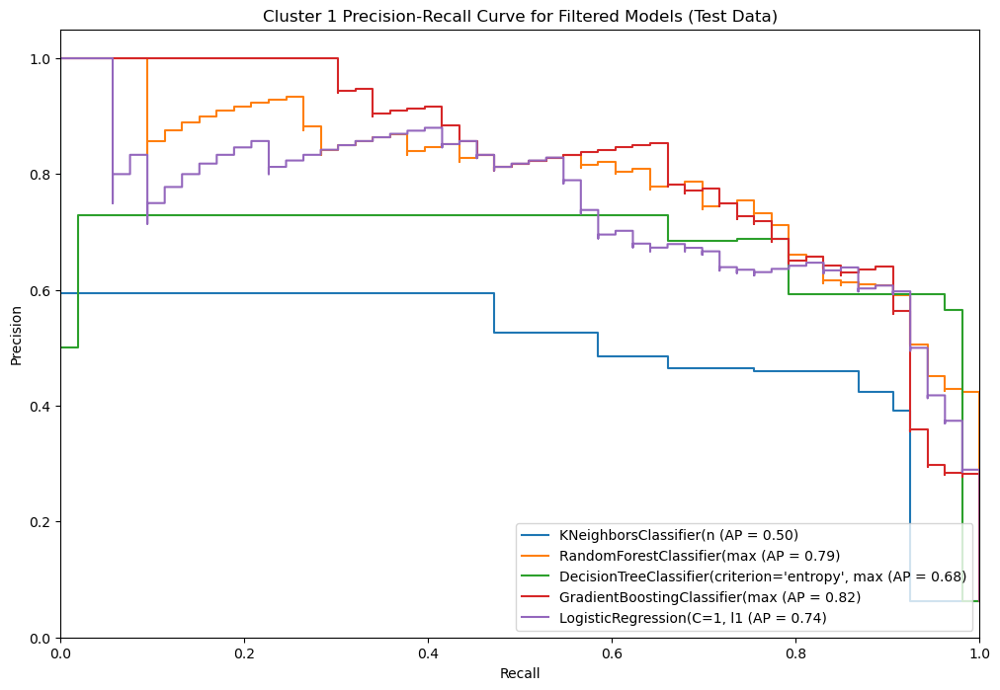

In [99]:
# Plot ROC curves and precision-recall curves for each model
plt.figure(figsize=(12, 8))


for model in std_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train, y_train)
    
    # Predict probabilities on the test set
    y_probs = model.predict_proba(X_test)[:, 1]
    
    # Calculate precision and recall
    precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
    average_precision = average_precision_score(y_test, y_probs)
    
    # Plot precision-recall curve
    plt.step(recall, precision, where='post', label=f'{short_model_name} (AP = {average_precision:.2f})')

# Customize the plot
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.title('Cluster 1 Precision-Recall Curve for Filtered Models (Test Data)')
plt.legend(loc='lower right')
plt.show()

C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


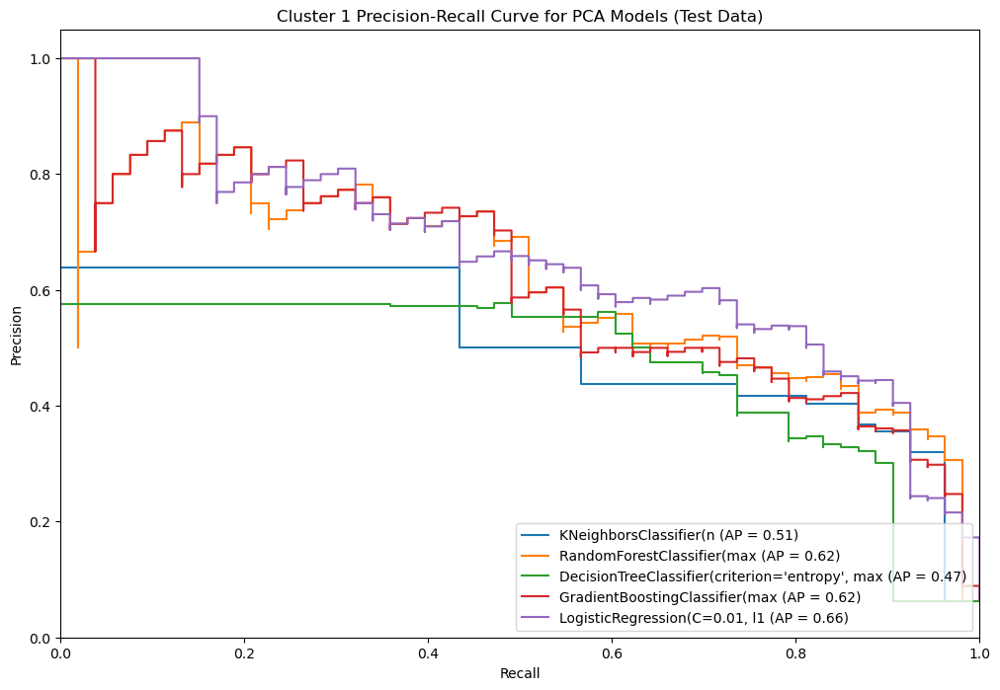

In [100]:
# Plot ROC curves and precision-recall curves for each model
plt.figure(figsize=(12, 8))


for model in pca_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_pca, y_train)
    
    # Predict probabilities on the test set
    y_probs = model.predict_proba(X_test_pca)[:, 1]
    
    # Calculate precision and recall
    precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
    average_precision = average_precision_score(y_test, y_probs)
    
    # Plot precision-recall curve
    plt.step(recall, precision, where='post', label=f'{short_model_name} (AP = {average_precision:.2f})')

# Customize the plot
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.title('Cluster 1 Precision-Recall Curve for PCA Models (Test Data)')
plt.legend(loc='lower right')
plt.show()

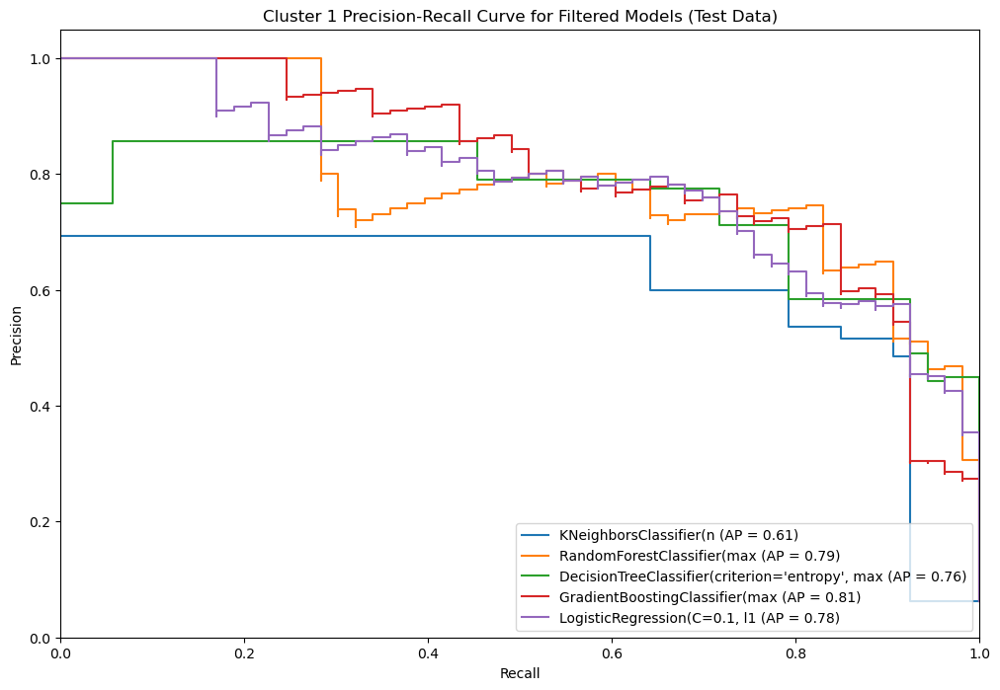

In [101]:
# Plot ROC curves and precision-recall curves for each model
plt.figure(figsize=(12, 8))


for model in filter_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_filter, y_train)
    
    # Predict probabilities on the test set
    y_probs = model.predict_proba(X_test_filter)[:, 1]
    
    # Calculate precision and recall
    precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
    average_precision = average_precision_score(y_test, y_probs)
    
    # Plot precision-recall curve
    plt.step(recall, precision, where='post', label=f'{short_model_name} (AP = {average_precision:.2f})')

# Customize the plot
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.title('Cluster 1 Precision-Recall Curve for Filtered Models (Test Data)')
plt.legend(loc='lower right')
plt.show()

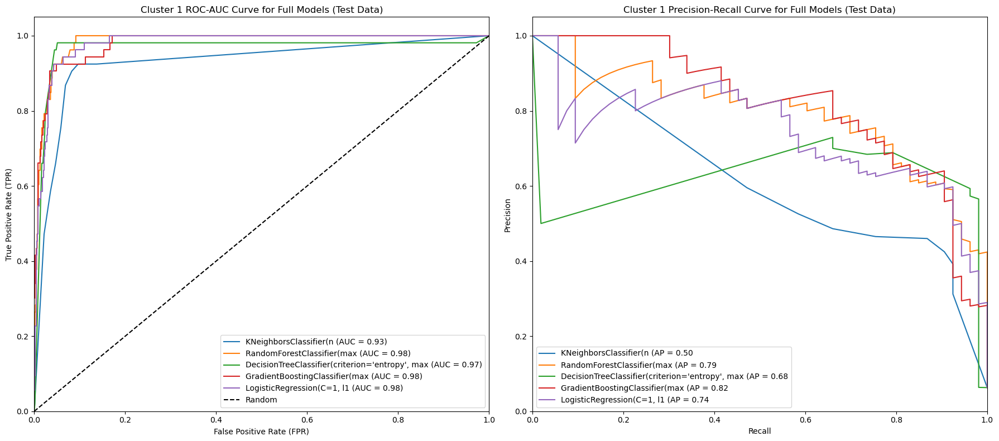

In [111]:
# Create a 1x2 grid for subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Plot Precision-Recall curves for AP-optimized models
axes[0].set_title('Cluster 1 ROC-AUC Curve for Full Models (Test Data)')
axes[0].set_xlabel('False Positive Rate (FPR)')
axes[0].set_ylabel('True Positive Rate (TPR)')

for model in std_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train, y_train)
    
    y_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    axes[0].plot(fpr, tpr, label=f'{short_model_name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random chance
axes[0].plot([0, 1], [0, 1], 'k--', label='Random')

# Customize the plot
axes[0].legend(loc='lower right')
axes[0].set_xlim([0.0, 1.0])
axes[0].set_ylim([0.0, 1.05])

# Plot Precision-Recall curves for full models
axes[1].set_title('Cluster 1 Precision-Recall Curve for Full Models (Test Data)')
axes[1].set_xlabel('Recall')
axes[1].set_ylabel('Precision')

for model in std_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train, y_train)
    
    # Predict probabilities on the test set
    y_probs = model.predict_proba(X_test)[:, 1]
    
    # Calculate precision and recall
    precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
    average_precision = average_precision_score(y_test, y_probs)
    
    # Plot precision-recall curve
    axes[1].plot(recall, precision, label=f'{short_model_name} (AP = {average_precision:.2f}')

# Customize the plot
axes[1].legend(loc='lower left')
axes[1].set_xlim([0.0, 1.0])
axes[1].set_ylim([0.0, 1.05])

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()


C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(
C:\Users\Ethan Smith\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1165: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  warnings.warn(


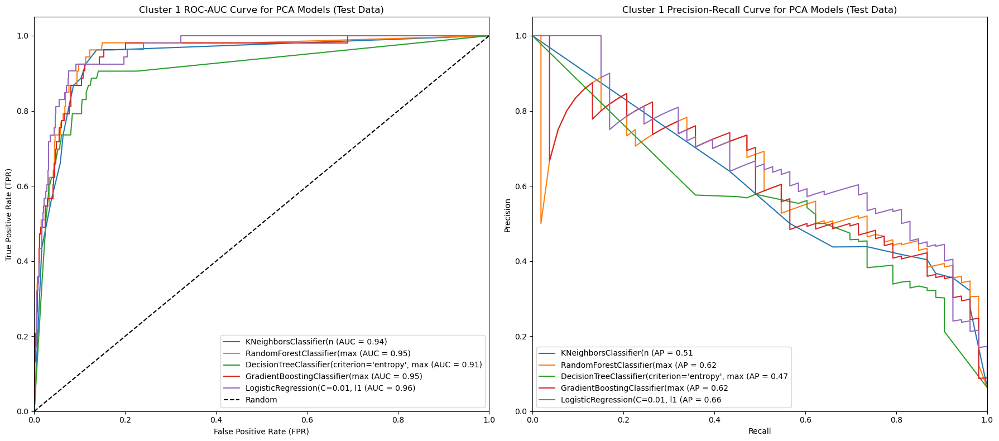

In [113]:
# Create a 1x2 grid for subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Plot Precision-Recall curves for AP-optimized models
axes[0].set_title('Cluster 1 ROC-AUC Curve for PCA Models (Test Data)')
axes[0].set_xlabel('False Positive Rate (FPR)')
axes[0].set_ylabel('True Positive Rate (TPR)')

for model in pca_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_pca, y_train)
    
    y_prob = model.predict_proba(X_test_pca)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    axes[0].plot(fpr, tpr, label=f'{short_model_name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random chance
axes[0].plot([0, 1], [0, 1], 'k--', label='Random')

# Customize the plot
axes[0].legend(loc='lower right')
axes[0].set_xlim([0.0, 1.0])
axes[0].set_ylim([0.0, 1.05])

# Plot Precision-Recall curves for full models
axes[1].set_title('Cluster 1 Precision-Recall Curve for PCA Models (Test Data)')
axes[1].set_xlabel('Recall')
axes[1].set_ylabel('Precision')

for model in pca_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_pca, y_train)
    
    # Predict probabilities on the test set
    y_probs = model.predict_proba(X_test_pca)[:, 1]
    
    # Calculate precision and recall
    precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
    average_precision = average_precision_score(y_test, y_probs)
    
    # Plot precision-recall curve
    axes[1].plot(recall, precision, label=f'{short_model_name} (AP = {average_precision:.2f}')

# Customize the plot
axes[1].legend(loc='lower left')
axes[1].set_xlim([0.0, 1.0])
axes[1].set_ylim([0.0, 1.05])

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()


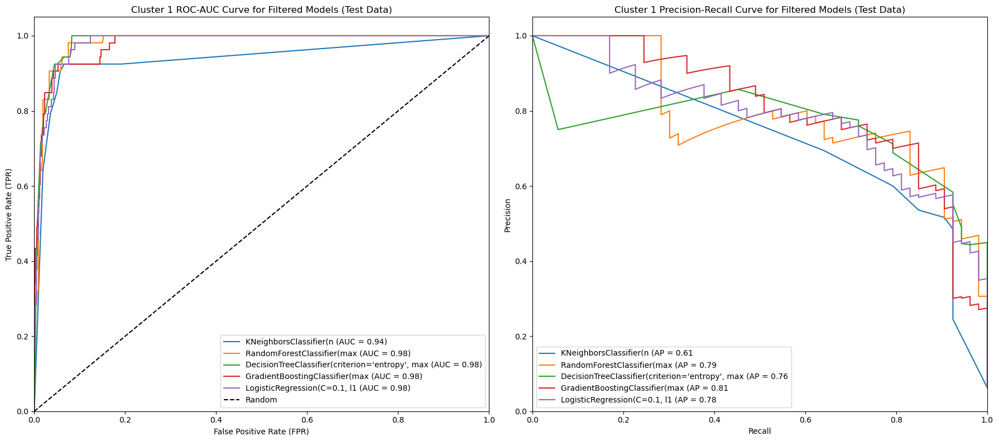

In [112]:
# Create a 1x2 grid for subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Plot Precision-Recall curves for AP-optimized models
axes[0].set_title('Cluster 1 ROC-AUC Curve for Filtered Models (Test Data)')
axes[0].set_xlabel('False Positive Rate (FPR)')
axes[0].set_ylabel('True Positive Rate (TPR)')

for model in filter_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_filter, y_train)
    
    y_prob = model.predict_proba(X_test_filter)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    axes[0].plot(fpr, tpr, label=f'{short_model_name} (AUC = {roc_auc:.2f})')

# Plot the diagonal line representing random chance
axes[0].plot([0, 1], [0, 1], 'k--', label='Random')

# Customize the plot
axes[0].legend(loc='lower right')
axes[0].set_xlim([0.0, 1.0])
axes[0].set_ylim([0.0, 1.05])

# Plot Precision-Recall curves for full models
axes[1].set_title('Cluster 1 Precision-Recall Curve for Filtered Models (Test Data)')
axes[1].set_xlabel('Recall')
axes[1].set_ylabel('Precision')

for model in filter_models:
    model_name_parts = str(model).split('_')
    short_model_name = model_name_parts[0]  # Use the first part as the model name
    
    model.fit(X_train_filter, y_train)
    
    # Predict probabilities on the test set
    y_probs = model.predict_proba(X_test_filter)[:, 1]
    
    # Calculate precision and recall
    precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
    average_precision = average_precision_score(y_test, y_probs)
    
    # Plot precision-recall curve
    axes[1].plot(recall, precision, label=f'{short_model_name} (AP = {average_precision:.2f}')

# Customize the plot
axes[1].legend(loc='lower left')
axes[1].set_xlim([0.0, 1.0])
axes[1].set_ylim([0.0, 1.05])

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()
